In [1]:
import sagemaker
import boto3
import numpy as np                                # For performing matrix operations and numerical processing
import pandas as pd                               # For manipulating tabular data
from time import gmtime, strftime
import os
import io
import re

import plotly.express as px

pd.set_option('display.max_columns', 500)

## Store Order

In [2]:
conn = boto3.client('s3')
bucket='cdh-audi-in-s3-prod-reporting-myaudi-eu-w1'
subfolder='reporting/store-order/'
contents = conn.list_objects(Bucket=bucket, Prefix=subfolder)['Contents']

list_so=[]
for f in contents:
    list_so.append(f['Key'])

In [3]:
myAudi_SO = pd.DataFrame()
for i in list_so:
    data_location = 's3://{}/{}'.format(bucket,i)
#     print(data_location)
    df1 = pd.read_parquet(data_location, engine='pyarrow')
    myAudi_SO=myAudi_SO.append(df1)

/tmp/ipykernel_9292/3293573381.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  myAudi_SO=myAudi_SO.append(df1)
/tmp/ipykernel_9292/3293573381.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  myAudi_SO=myAudi_SO.append(df1)
/tmp/ipykernel_9292/3293573381.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  myAudi_SO=myAudi_SO.append(df1)
/tmp/ipykernel_9292/3293573381.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  myAudi_SO=myAudi_SO.append(df1)
/tmp/ipykernel_9292/3293573381.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  myAudi_SO=my

In [4]:
myAudi_SO

,id,accountId,parentId,locationId,memberId,cartId,contact,purchasedDate,deliveryDate,deliveryAddress,pickupAddress,billingAddress,isSelfPickup,status,paymentType,paymentId,currency,price,priceShipping,priceCancelled,priceAdded,priceSplitted,formResultId,shipperId,trackingCode,deliveryStatus,statusId,statusUpdatedOn,snoozedUntilTime,pickedupBy,isReturn,returnReason,couponId,couponCode,discount,moduleId,moduleItemId,staffCreatedBy,staffCreatedOn,createdOn,createdBy,updatedOn,updatedBy,archivedBy,isArchived,paymentMerchantRequest,paymentMerchantResponse,idAndFullNameWithNumber,locationName,orderStatusName,orderStatusColor,razorPayIds,grandTotal
0,5482,19,None,31,73451,49546,9711925169,2022-10-07 17:26:34,None,None,None,None,None,Paid,RazorPay,41021,INR,874.0,0.0,0.0,0.0,0.0,None,None,None,None,9,2023-01-14 06:44:25,2023-01-14 06:44:25,None,None,None,None,None,0.0,None,None,None,None,2022-10-07 11:56:34,73451,2023-01-14 06:44:25,None,None,None,None,None,#5482 - Vishwajeet Kaushik(+91 9711925169) / v...,Audi Delhi South,Delivered,#0400ff,/,Rs 874
1,1375,19,None,31,3567,5652,9650746888,2021-10-28 11:16:15,None,None,None,None,None,Paid,RazorPay,8631,INR,14951.0,120.0,0.0,0.0,0.0,None,None,None,None,9,2021-11-10 08:30:40,2021-11-10 08:30:40,None,None,None,None,None,0.0,None,None,None,None,2021-10-28 05:46:15,3567,2021-11-10 08:30:40,None,None,None,None,None,#1375 - RAMESH KAUSHIK(+91 9650746888) / katka...,Audi Delhi South,Delivered,#0400ff,order_IEe6wG0jrbTruH / pay_IEe881EayJpSHb,"Rs 15,071"
2,2385,19,None,31,19227,23619,9910003500,2022-02-11 00:18:18,None,None,None,None,None,Paid,RazorPay,18291,INR,3293.0,120.0,0.0,0.0,0.0,None,None,None,None,9,2022-02-14 06:24:01,2022-02-14 06:24:01,None,None,None,None,None,0.0,None,None,None,None,2022-02-10 18:48:18,19227,2022-02-14 06:24:01,None,None,None,None,None,#2385 - Parth Mehta(+91 9910003500) / parthmeh...,Audi Delhi South,Delivered,#0400ff,order_IuPWhdvxxgpiZV / pay_IuPXMQGzVGSnlW,"Rs 3,413"
3,4386,19,None,23,82674,43818,8128155555,2022-08-19 07:50:16,None,None,None,None,None,Pending,RazorPay,33911,INR,200000.0,0.0,0.0,0.0,0.0,None,None,None,None,17,2022-08-19 02:20:16,2022-08-19 02:20:16,None,None,None,None,None,0.0,None,None,None,None,2022-08-19 02:20:16,82674,2022-08-19 02:20:16,None,None,None,None,None,#4386 - Nishan Patel(+91 8128155555) / nishan@...,Audi Ahmedabad,New Failed Order,#dd720e,None,"Rs 2,00,000"
4,4332,19,None,34,41384,14733,9884715477,2022-08-17 09:14:39,None,None,None,None,None,Pending,RazorPay,33624,INR,6221.0,120.0,0.0,0.0,0.0,None,None,None,None,17,2022-08-17 03:44:39,2022-08-17 03:44:39,None,None,None,None,None,0.0,None,None,None,None,2022-08-17 03:44:39,41384,2022-08-17 03:44:39,None,None,None,None,None,#4332 - Andrew Anantharaj(+91 9884715477) / an...,Audi Chennai,New Failed Order,#dd720e,None,"Rs 6,341"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,2958,19,None,16,57920,27527,9975032331,2022-04-22 19:46:39,None,None,None,None,None,Paid,RazorPay,23047,INR,1741.0,120.0,0.0,0.0,0.0,None,None,None,None,9,2022-04-27 13:04:58,2022-04-27 13:04:58,None,None,None,None,None,0.0,None,None,None,None,2022-04-22 14:16:39,57920,2022-04-27 13:04:58,None,None,None,None,None,#2958 - Satish Rehpade(+91 9975032331) / rehpa...,Audi Pune,Delivered,#0400ff,order_JMQpHr3sH1ZX3J / pay_JMQqhdGlaXiwKb,"Rs 1,861"
1,7120,19,None,41,14281,14957,9873570802,2022-12-28 22:48:34,None,None,None,None,None,Pending,RazorPay,64718,INR,6850.0,120.0,0.0,0.0,0.0,None,None,None,None,17,2022-12-28 17:18:34,2022-12-28 17:18:34,None,None,None,6,AudiXmas30,2055.0,None,None,None,None,2022-12-28 17:18:34,14281,2022-12-28 17:18:34,None,None,None,None,None,#7120 - Thrideep Kumar(+91 9873570802) / deepa...,Audi Gurugram,New Failed Order,#dd720e,None,"Rs 4,915"
2,6065,19,None,16,18936,53520,9359421479,2022-11-07 14:39:14,None,None,None,None,No

In [5]:
myAudi_SO.columns

Index(['id', 'accountId', 'parentId', 'locationId', 'memberId', 'cartId',
       'contact', 'purchasedDate', 'deliveryDate', 'deliveryAddress',
       'pickupAddress', 'billingAddress', 'isSelfPickup', 'status',
       'paymentType', 'paymentId', 'currency', 'price', 'priceShipping',
       'priceCancelled', 'priceAdded', 'priceSplitted', 'formResultId',
       'shipperId', 'trackingCode', 'deliveryStatus', 'statusId',
       'statusUpdatedOn', 'snoozedUntilTime', 'pickedupBy', 'isReturn',
       'returnReason', 'couponId', 'couponCode', 'discount', 'moduleId',
       'moduleItemId', 'staffCreatedBy', 'staffCreatedOn', 'createdOn',
       'createdBy', 'updatedOn', 'updatedBy', 'archivedBy', 'isArchived',
       'paymentMerchantRequest', 'paymentMerchantResponse',
       'idAndFullNameWithNumber', 'locationName', 'orderStatusName',
       'orderStatusColor', 'razorPayIds', 'grandTotal'],
      dtype='object')

## Order Line Item

In [315]:
conn = boto3.client('s3')
bucket='cdh-audi-in-s3-prod-reporting-myaudi-eu-w1'
subfolder='reporting/order-line-items/'
contents = conn.list_objects(Bucket=bucket, Prefix=subfolder)['Contents']

list_so=[]
for f in contents:
    list_so.append(f['Key'])
    print(f['Key'])

reporting/order-line-items/part-00000-8b7ef181-d390-4601-a626-c95d0f30f41d-c000.snappy.parquet


In [316]:
myAudi_oli = pd.DataFrame()
data_location = 's3://{}/{}'.format(bucket,list_so[0])
#     print(data_location)
df1 = pd.read_parquet(data_location, engine='pyarrow')
myAudi_oli=myAudi_oli.append(df1)

/tmp/ipykernel_9292/2058960812.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  myAudi_oli=myAudi_oli.append(df1)


In [8]:
myAudi_oli

,id,accountId,locationId,orderId,itemId,itemVariantId,formResultId,quantity,price,tax,taxInfo,total,name,status,isRefunded,isCancelled,isItemAdded,couponId,couponCode,discount,fulfillmentType,fulfillmentPrice,addressBookId,fulfillmentAddress,fulfillmentLocationId,fulfillmentLocationPrice,fulfillmentLocationInfo,postOrderModuleId,postOrderModuleItemId,postOrderAction,postOrderResultId,staffCreatedBy,staffCreatedOn,createdOn,createdBy,variantWithItemName,fulfillmentLocationName
0,8,19,16,5,47,73,None,1,1.0,None,None,1.0,"Chronograph Men, Red/Black",pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-04-16 08:43:24,278,"Chronograph Men, Red/Black",None
1,9,19,16,6,47,73,None,1,1.0,None,None,1.0,"Chronograph Men, Red/Black",pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-04-16 08:55:38,278,"Chronograph Men, Red/Black",None
2,10,19,16,7,47,73,None,1,1.0,None,None,1.0,"Chronograph Men, Red/Black",pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-04-16 08:58:21,278,"Chronograph Men, Red/Black",None
3,11,19,16,8,47,73,None,1,1.0,None,None,1.0,"Chronograph Men, Red/Black",paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-04-16 09:01:28,278,"Chronograph Men, Red/Black",None
4,12,19,16,9,47,73,None,1,1.0,None,None,1.0,"Chronograph Men, Red/Black",paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-04-16 10:26:21,278,"Chronograph Men, Red/Black",None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10161,10497,19,39,8335,590,749,None,1,6059.0,None,None,6059.0,Size S,paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2023-02-12 14:25:27,40124,"Audi Fleece Jacket, Mens, Black / Size S",None
10162,10498,19,39,8335,113,167,None,1,16244.0,None,None,16244.0,Size XL,paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2023-02-12 14:25:27,40124,"Audi Quilted Jacket, Mens / Size XL",None
10163,10499,19,41,8336,204,301,None,1,4898.0,None,None,4898.0,"Audi Q2 All-weather Floor Mats, Front",paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2023-02-12 15:05:58,39143,"Audi Q2 All-weather Floor Mats, Front / Audi Q...",None
10164,10500,19,31,8337,204,301,None,1,4898.0,None,None,4898.0,"Audi Q2 All-weather Floor Mats, Front",pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2023-02-12 15:10:37,39143,"Audi Q2 All-weather Floor Mats, Front / Audi Q...",None


# Varient

In [317]:
conn = boto3.client('s3')
bucket='cdh-audi-in-s3-prod-reporting-myaudi-eu-w1'
subfolder='reporting/variants/'
contents = conn.list_objects(Bucket=bucket, Prefix=subfolder)['Contents']

list_so=[]
for f in contents:
    list_so.append(f['Key'])

In [318]:
myAudi_Varients = pd.DataFrame()
for i in list_so:
    data_location = 's3://{}/{}'.format(bucket,i)
#     print(data_location)
    df1 = pd.read_parquet(data_location, engine='pyarrow')
    myAudi_Varients=myAudi_Varients.append(df1)

/tmp/ipykernel_9292/1554467054.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  myAudi_Varients=myAudi_Varients.append(df1)


In [319]:
myAudi_Varients

,id,accountId,itemId,variantLocations,productCode,size,color,material,style,title,price,images,compareAtPrice,costPerItem,taxes,taxInfo,priceAfterTax,quantity,blocked,finalQuantity,isMinQuantity,minQuantity,isMaxQuantity,maxQuantity,isIncrementStep,incrementStep,weight,shippingType,isDisabledShipping,shippingPrice,isDisabledSelfPickup,selfPickupPrice,isDisabledFitment,fitmentPrice,isPublished,isPurchasable,order,pageId,postOrderModuleId,postOrderModuleItemId,postOrderAction,createdOn,createdBy,updatedOn,updatedBy,archivedBy,isArchived,taxInfoWithDecoded,photoArray,publishedText,invertedPublishedText,description,configStatus,photo
0,925,19,700,None,81A054690A,None,None,None,None,Retrofit solution for cruise control system,23942.0,None,None,23942.0,None,None,23942.0,4,0,4,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2023-02-07 13:43:01,393,2023-02-13 13:02:37,393,None,None,[],[],Published,Un-Publish,None,[],None
1,926,19,701,None,80A061205,None,None,None,None,Car cover (indoor) with Audi rings,24783.0,None,None,24783.0,None,None,24783.0,2,0,2,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2023-02-07 14:10:54,393,2023-02-13 13:09:15,393,None,None,[],[],Published,Un-Publish,None,[],None
2,927,19,702,None,4G5061197,None,None,None,None,Loading sill protective sheet,4445.0,None,None,4445.0,None,None,4445.0,5,0,5,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2023-02-07 14:11:04,370,2023-02-13 13:11:22,393,None,None,[],[],Published,Un-Publish,None,[],None
3,928,19,703,None,83A075111,None,None,None,None,Mud flaps,7890.0,None,None,7890.0,None,None,7890.0,73,0,73,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2023-02-07 14:21:31,370,2023-02-13 13:13:40,393,None,None,[],[],Published,Un-Publish,None,[],None
4,929,19,704,None,8Y4064317Z7G,None,None,None,None,Audi rings decals with heritage flag,4987.0,None,None,4987.0,None,None,4987.0,9,0,9,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2023-02-07 14:24:52,393,2023-02-09 07:40:36,393,None,None,[],[],Published,Un-Publish,None,[],None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
800,278,19,182,None,80A096311,None,None,None,None,2-in-1 Display Cleaner,1513.0,None,None,1226.0,None,None,1513.0,0,0,0,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,None,None,None,None,None,None,None,2021-05-06 12:51:38,92,2023-02-09 06:14:38,393,None,None,[],[],Not Published,Publish,None,[],None
801,314,19,217,None,4L0019819,None,None,None,None,Child Seat Underlay,4290.0,None,None,4290.0,None,None,4290.0,0,0,0,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,None,None,None,None,None,None,None,2021-05-10 10:21:32,92,2023-02-09 06:14:39,393,None,None,[],[],Not Published,Publish,None,[],None
802,391,19,289,None,8X0061680A,None,None,None,None,Rear Protective Cover in Audi Design,13374.0,None,None,15204.0,None,None,13374.0,0,0,0,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,None,None,None,None,None,None,None,2021-05-17 14:10:14,92,2023-02-09 06:14:39,393,None,None,[],[],Not Published,Publish,None,[],None
803,466,19,345,None,8U0061511041,None,None,None,None,"Audi Q3 Rubber Floor Mats, Rear",1952.0,||,None,2364.0,None,None,1952.0,0,0,0,None,None,None,None,None,None,None,perVariant,None,120.0,None,0.0,None,0.0,None,None,None,None,None,None,None,2021-07-06 12:48:10,92,2023-02-09 06:14:40,393,None,None,[],[],Not Published,Publish,None,[],None


In [320]:
myAudi_Varients['id'].nunique()

805

## Merging SO and OLI

In [12]:
df_merge_SO_OLI = pd.merge(myAudi_SO, myAudi_oli, left_on='id',right_on='orderId', how='inner')

In [13]:
df_merge_SO_OLI

,id_x,accountId_x,parentId,locationId_x,memberId,cartId,contact,purchasedDate,deliveryDate,deliveryAddress,pickupAddress,billingAddress,isSelfPickup,status_x,paymentType,paymentId,currency,price_x,priceShipping,priceCancelled,priceAdded,priceSplitted,formResultId_x,shipperId,trackingCode,deliveryStatus,statusId,statusUpdatedOn,snoozedUntilTime,pickedupBy,isReturn,returnReason,couponId_x,couponCode_x,discount_x,moduleId,moduleItemId,staffCreatedBy_x,staffCreatedOn_x,createdOn_x,createdBy_x,updatedOn,updatedBy,archivedBy,isArchived,paymentMerchantRequest,paymentMerchantResponse,idAndFullNameWithNumber,locationName,orderStatusName,orderStatusColor,razorPayIds,grandTotal,id_y,accountId_y,locationId_y,orderId,itemId,itemVariantId,formResultId_y,quantity,price_y,tax,taxInfo,total,name,status_y,isRefunded,isCancelled,isItemAdded,couponId_y,couponCode_y,discount_y,fulfillmentType,fulfillmentPrice,addressBookId,fulfillmentAddress,fulfillmentLocationId,fulfillmentLocationPrice,fulfillmentLocationInfo,postOrderModuleId,postOrderModuleItemId,postOrderAction,postOrderResultId,staffCreatedBy_y,staffCreatedOn_y,createdOn_y,createdBy_y,variantWithItemName,fulfillmentLocationName
0,5482,19,None,31,73451,49546,9711925169,2022-10-07 17:26:34,None,None,None,None,None,Paid,RazorPay,41021,INR,874.0,0.0,0.0,0.0,0.0,None,None,None,None,9,2023-01-14 06:44:25,2023-01-14 06:44:25,None,None,None,None,None,0.0,None,None,None,None,2022-10-07 11:56:34,73451,2023-01-14 06:44:25,None,None,None,None,None,#5482 - Vishwajeet Kaushik(+91 9711925169) / v...,Audi Delhi South,Delivered,#0400ff,/,Rs 874,7002,19,31,5482,131,197,None,1,874.0,None,None,874.0,Audi Sport Ballpointpen,paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2022-10-07 11:56:34,73451,Audi Sport Ballpoint pen / Audi Sport Ballpoin...,None
1,1375,19,None,31,3567,5652,9650746888,2021-10-28 11:16:15,None,None,None,None,None,Paid,RazorPay,8631,INR,14951.0,120.0,0.0,0.0,0.0,None,None,None,None,9,2021-11-10 08:30:40,2021-11-10 08:30:40,None,None,None,None,None,0.0,None,None,None,None,2021-10-28 05:46:15,3567,2021-11-10 08:30:40,None,None,None,None,None,#1375 - RAMESH KAUSHIK(+91 9650746888) / katka...,Audi Delhi South,Delivered,#0400ff,order_IEe6wG0jrbTruH / pay_IEe881EayJpSHb,"Rs 15,071",1769,19,31,1375,199,295,None,1,3312.0,None,None,3312.0,Rubbish Bin,paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-10-28 05:46:15,3567,Rubbish Bin / Rubbish Bin,None
2,1375,19,None,31,3567,5652,9650746888,2021-10-28 11:16:15,None,None,None,None,None,Paid,RazorPay,8631,INR,14951.0,120.0,0.0,0.0,0.0,None,None,None,None,9,2021-11-10 08:30:40,2021-11-10 08:30:40,None,None,None,None,None,0.0,None,None,None,None,2021-10-28 05:46:15,3567,2021-11-10 08:30:40,None,None,None,None,None,#1375 - RAMESH KAUSHIK(+91 9650746888) / katka...,Audi Delhi South,Delivered,#0400ff,order_IEe6wG0jrbTruH / pay_IEe881EayJpSHb,"Rs 15,071",1770,19,31,1375,368,494,None,1,8530.0,None,None,8530.0,Audi Q3 Bootliner,paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-10-28 05:46:15,3567,Audi Q3 Boot Liner / Audi Q3 Bootliner,None
3,1375,19,None,31,3567,5652,9650746888,2021-10-28 11:16:15,None,None,None,None,None,Paid,RazorPay,8631,INR,14951.0,120.0,0.0,0.0,0.0,None,None,None,None,9,2021-11-10 08:30:40,2021-11-10 08:30:40,None,None,None,None,None,0.0,None,None,None,None,2021-10-28 05:46:15,3567,2021-11-10 08:30:40,None,None,None,None,None,#1375 - RAMESH KAUSHIK(+91 9650746888) / katka...,Audi Delhi South,Delivered,#0400ff,order_IEe6wG0jrbTruH / pay_IEe881EayJpSHb,"Rs 15,071",1771,19,31,1375,535,669,None,1,1682.0,None,None,1682.0,"Audi Sport Tubular Scarf, Red/ grey",paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-10-28 05:46:15,3567,"Audi Sport Tubular Scarf, Red/Grey / Audi Spor...",None
4,1375,19,None,31,3567,5652,9650746888,2021-10-28 11:16:15,None,N

In [14]:
df_merge_SO_OLI.columns

Index(['id_x', 'accountId_x', 'parentId', 'locationId_x', 'memberId', 'cartId',
       'contact', 'purchasedDate', 'deliveryDate', 'deliveryAddress',
       'pickupAddress', 'billingAddress', 'isSelfPickup', 'status_x',
       'paymentType', 'paymentId', 'currency', 'price_x', 'priceShipping',
       'priceCancelled', 'priceAdded', 'priceSplitted', 'formResultId_x',
       'shipperId', 'trackingCode', 'deliveryStatus', 'statusId',
       'statusUpdatedOn', 'snoozedUntilTime', 'pickedupBy', 'isReturn',
       'returnReason', 'couponId_x', 'couponCode_x', 'discount_x', 'moduleId',
       'moduleItemId', 'staffCreatedBy_x', 'staffCreatedOn_x', 'createdOn_x',
       'createdBy_x', 'updatedOn', 'updatedBy', 'archivedBy', 'isArchived',
       'paymentMerchantRequest', 'paymentMerchantResponse',
       'idAndFullNameWithNumber', 'locationName', 'orderStatusName',
       'orderStatusColor', 'razorPayIds', 'grandTotal', 'id_y', 'accountId_y',
       'locationId_y', 'orderId', 'itemId', 'itemVar

# Merge OLI, SO and Varient

In [15]:
df_merge_SO_OLI_Varient = pd.merge(df_merge_SO_OLI, myAudi_Varients, left_on='itemVariantId',right_on='id', how='inner')

In [16]:
df_merge_SO_OLI_Varient

,id_x,accountId_x,parentId,locationId_x,memberId,cartId,contact,purchasedDate,deliveryDate,deliveryAddress,pickupAddress,billingAddress,isSelfPickup,status_x,paymentType,paymentId,currency,price_x,priceShipping,priceCancelled,priceAdded,priceSplitted,formResultId_x,shipperId,trackingCode,deliveryStatus,statusId,statusUpdatedOn,snoozedUntilTime,pickedupBy,isReturn,returnReason,couponId_x,couponCode_x,discount_x,moduleId,moduleItemId,staffCreatedBy_x,staffCreatedOn_x,createdOn_x,createdBy_x,updatedOn_x,updatedBy_x,archivedBy_x,isArchived_x,paymentMerchantRequest,paymentMerchantResponse,idAndFullNameWithNumber,locationName,orderStatusName,orderStatusColor,razorPayIds,grandTotal,id_y,accountId_y,locationId_y,orderId,itemId_x,itemVariantId,formResultId_y,quantity_x,price_y,tax,taxInfo_x,total,name,status_y,isRefunded,isCancelled,isItemAdded,couponId_y,couponCode_y,discount_y,fulfillmentType,fulfillmentPrice,addressBookId,fulfillmentAddress,fulfillmentLocationId,fulfillmentLocationPrice,fulfillmentLocationInfo,postOrderModuleId_x,postOrderModuleItemId_x,postOrderAction_x,postOrderResultId,staffCreatedBy_y,staffCreatedOn_y,createdOn_y,createdBy_y,variantWithItemName,fulfillmentLocationName,id,accountId,itemId_y,variantLocations,productCode,size,color,material,style,title,price,images,compareAtPrice,costPerItem,taxes,taxInfo_y,priceAfterTax,quantity_y,blocked,finalQuantity,isMinQuantity,minQuantity,isMaxQuantity,maxQuantity,isIncrementStep,incrementStep,weight,shippingType,isDisabledShipping,shippingPrice,isDisabledSelfPickup,selfPickupPrice,isDisabledFitment,fitmentPrice,isPublished,isPurchasable,order,pageId,postOrderModuleId_y,postOrderModuleItemId_y,postOrderAction_y,createdOn,createdBy,updatedOn_y,updatedBy_y,archivedBy_y,isArchived_y,taxInfoWithDecoded,photoArray,publishedText,invertedPublishedText,description,configStatus,photo
0,5482,19,None,31,73451,49546,9711925169,2022-10-07 17:26:34,None,None,None,None,None,Paid,RazorPay,41021,INR,874.0,0.0,0.0,0.0,0.0,None,None,None,None,9,2023-01-14 06:44:25,2023-01-14 06:44:25,None,None,None,None,None,0.0,None,None,None,None,2022-10-07 11:56:34,73451,2023-01-14 06:44:25,None,None,None,None,None,#5482 - Vishwajeet Kaushik(+91 9711925169) / v...,Audi Delhi South,Delivered,#0400ff,/,Rs 874,7002,19,31,5482,131,197,None,1,874.0,None,None,874.0,Audi Sport Ballpointpen,paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2022-10-07 11:56:34,73451,Audi Sport Ballpoint pen / Audi Sport Ballpoin...,None,197,19,131,None,3221800500,None,None,None,None,Audi Sport Ballpointpen,1049.0,||,None,683.0,None,None,1049.0,54,0,54,None,None,None,None,None,None,500,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2021-05-03 07:10:37,92,2023-02-11 05:50:16,393,None,None,[],[],Published,Un-Publish,None,[],None
1,438,19,None,35,23364,None,9253351888,2021-07-05 14:28:12,None,None,None,None,None,Pending,RazorPay,6247,INR,683.0,120.0,0.0,0.0,0.0,None,None,None,None,None,NaT,2021-08-23 14:19:27,None,None,None,None,None,0.0,None,None,None,None,2021-07-05 08:58:12,23364,2021-07-05 08:58:12,None,None,None,None,None,#438 - Santosh Singh(+91 9253351888) / rksingh...,Audi Karnal,None,None,None,Rs 803,504,19,35,438,131,197,None,1,683.0,None,None,683.0,Audi Sport Ballpointpen,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-07-05 08:58:12,23364,Audi Sport Ballpointpen,None,197,19,131,None,3221800500,None,None,None,None,Audi Sport Ballpointpen,1049.0,||,None,683.0,None,None,1049.0,54,0,54,None,None,None,None,None,None,500,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2021-05-03 07:10:37,92,2023-02-11 05:50:16,393,None,None,[],[],Published,Un-Publish,None,[],None
2,5340,19,None,43,6181,46462,9819942423,2022-10-01 10:33:21,None,None,None,None,None,Pending,RazorPay,40015,INR,4167.0,0.0,0.0,0.0,0.0,None,None,None,None,17,2022-10-01 05:03:21,2022-10-01 05:03:21,None,None,None,None,None,0.0,

In [17]:
(df_merge_SO_OLI_Varient['title'].nunique())

442

In [18]:
(df_merge_SO_OLI_Varient['name'].nunique())

448

In [19]:
df_merge_SO_OLI['name'].nunique()

454

In [20]:
df_merge_SO_OLI_Varient['title'].nunique()

442

In [21]:
df_merge_SO_OLI_Varient.columns.tolist()

['id_x',
 'accountId_x',
 'parentId',
 'locationId_x',
 'memberId',
 'cartId',
 'contact',
 'purchasedDate',
 'deliveryDate',
 'deliveryAddress',
 'pickupAddress',
 'billingAddress',
 'isSelfPickup',
 'status_x',
 'paymentType',
 'paymentId',
 'currency',
 'price_x',
 'priceShipping',
 'priceCancelled',
 'priceAdded',
 'priceSplitted',
 'formResultId_x',
 'shipperId',
 'trackingCode',
 'deliveryStatus',
 'statusId',
 'statusUpdatedOn',
 'snoozedUntilTime',
 'pickedupBy',
 'isReturn',
 'returnReason',
 'couponId_x',
 'couponCode_x',
 'discount_x',
 'moduleId',
 'moduleItemId',
 'staffCreatedBy_x',
 'staffCreatedOn_x',
 'createdOn_x',
 'createdBy_x',
 'updatedOn_x',
 'updatedBy_x',
 'archivedBy_x',
 'isArchived_x',
 'paymentMerchantRequest',
 'paymentMerchantResponse',
 'idAndFullNameWithNumber',
 'locationName',
 'orderStatusName',
 'orderStatusColor',
 'razorPayIds',
 'grandTotal',
 'id_y',
 'accountId_y',
 'locationId_y',
 'orderId',
 'itemId_x',
 'itemVariantId',
 'formResultId_y',
 

## Purchase Date

In [22]:
df_merge_SO_OLI_Varient['year']=df_merge_SO_OLI_Varient['purchasedDate'].dt.year

In [23]:
df_merge_SO_OLI_Varient['year'].value_counts()

2022    6282
2021    2483
2023    1380
Name: year, dtype: int64

In [24]:
df_merge_SO_OLI_Varient['month']=df_merge_SO_OLI_Varient['purchasedDate'].dt.month

In [25]:
df_merge_SO_OLI_Varient['month'].value_counts()

12    1308
1     1262
8     1237
9     1144
10    1041
11     975
7      752
2      741
6      648
5      389
3      325
4      323
Name: month, dtype: int64

In [26]:
df_merge_SO_OLI_Varient['purchasedDate'] = df_merge_SO_OLI_Varient['purchasedDate'].dt.date

In [27]:
df_merge_SO_OLI_Varient['month-year']=pd.to_datetime(df_merge_SO_OLI_Varient['purchasedDate']).dt.strftime('%Y-%m')

In [33]:
df_merge_SO_OLI_Varient.columns.tolist()

['id_x',
 'accountId_x',
 'parentId',
 'locationId_x',
 'memberId',
 'cartId',
 'contact',
 'purchasedDate',
 'deliveryDate',
 'deliveryAddress',
 'pickupAddress',
 'billingAddress',
 'isSelfPickup',
 'status_x',
 'paymentType',
 'paymentId',
 'currency',
 'price_x',
 'priceShipping',
 'priceCancelled',
 'priceAdded',
 'priceSplitted',
 'formResultId_x',
 'shipperId',
 'trackingCode',
 'deliveryStatus',
 'statusId',
 'statusUpdatedOn',
 'snoozedUntilTime',
 'pickedupBy',
 'isReturn',
 'returnReason',
 'couponId_x',
 'couponCode_x',
 'discount_x',
 'moduleId',
 'moduleItemId',
 'staffCreatedBy_x',
 'staffCreatedOn_x',
 'createdOn_x',
 'createdBy_x',
 'updatedOn_x',
 'updatedBy_x',
 'archivedBy_x',
 'isArchived_x',
 'paymentMerchantRequest',
 'paymentMerchantResponse',
 'idAndFullNameWithNumber',
 'locationName',
 'orderStatusName',
 'orderStatusColor',
 'razorPayIds',
 'grandTotal',
 'id_y',
 'accountId_y',
 'locationId_y',
 'orderId',
 'itemId_x',
 'itemVariantId',
 'formResultId_y',
 

# Composite Key

In [68]:
df_merge_SO_OLI_Varient['name_varientId']=df_merge_SO_OLI_Varient['name']+df_merge_SO_OLI_Varient['itemVariantId']

In [84]:
df_merge_SO_OLI_Varient['name_varientId'].nunique()

565

In [94]:
df_merge_SO_OLI_Varient

,id_x,accountId_x,parentId,locationId_x,memberId,cartId,contact,purchasedDate,deliveryDate,deliveryAddress,pickupAddress,billingAddress,isSelfPickup,status_x,paymentType,paymentId,currency,price_x,priceShipping,priceCancelled,priceAdded,priceSplitted,formResultId_x,shipperId,trackingCode,deliveryStatus,statusId,statusUpdatedOn,snoozedUntilTime,pickedupBy,isReturn,returnReason,couponId_x,couponCode_x,discount_x,moduleId,moduleItemId,staffCreatedBy_x,staffCreatedOn_x,createdOn_x,createdBy_x,updatedOn_x,updatedBy_x,archivedBy_x,isArchived_x,paymentMerchantRequest,paymentMerchantResponse,idAndFullNameWithNumber,locationName,orderStatusName,orderStatusColor,razorPayIds,grandTotal,id_y,accountId_y,locationId_y,orderId,itemId_x,itemVariantId,formResultId_y,quantity_x,price_y,tax,taxInfo_x,total,name,status_y,isRefunded,isCancelled,isItemAdded,couponId_y,couponCode_y,discount_y,fulfillmentType,fulfillmentPrice,addressBookId,fulfillmentAddress,fulfillmentLocationId,fulfillmentLocationPrice,fulfillmentLocationInfo,postOrderModuleId_x,postOrderModuleItemId_x,postOrderAction_x,postOrderResultId,staffCreatedBy_y,staffCreatedOn_y,createdOn_y,createdBy_y,variantWithItemName,fulfillmentLocationName,id,accountId,itemId_y,variantLocations,productCode,size,color,material,style,title,price,images,compareAtPrice,costPerItem,taxes,taxInfo_y,priceAfterTax,quantity_y,blocked,finalQuantity,isMinQuantity,minQuantity,isMaxQuantity,maxQuantity,isIncrementStep,incrementStep,weight,shippingType,isDisabledShipping,shippingPrice,isDisabledSelfPickup,selfPickupPrice,isDisabledFitment,fitmentPrice,isPublished,isPurchasable,order,pageId,postOrderModuleId_y,postOrderModuleItemId_y,postOrderAction_y,createdOn,createdBy,updatedOn_y,updatedBy_y,archivedBy_y,isArchived_y,taxInfoWithDecoded,photoArray,publishedText,invertedPublishedText,description,configStatus,photo,year,month,month-year,name_varientId,name_varientName
0,5482,19,None,31,73451,49546,9711925169,2022-10-07,None,None,None,None,None,Paid,RazorPay,41021,INR,874.0,0.0,0.0,0.0,0.0,None,None,None,None,9,2023-01-14 06:44:25,2023-01-14 06:44:25,None,None,None,None,None,0.0,None,None,None,None,2022-10-07 11:56:34,73451,2023-01-14 06:44:25,None,None,None,None,None,#5482 - Vishwajeet Kaushik(+91 9711925169) / v...,Audi Delhi South,Delivered,#0400ff,/,Rs 874,7002,19,31,5482,131,197,None,1,874.0,None,None,874.0,Audi Sport Ballpointpen,paid,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2022-10-07 11:56:34,73451,Audi Sport Ballpoint pen / Audi Sport Ballpoin...,None,197,19,131,None,3221800500,None,None,None,None,Audi Sport Ballpointpen,1049.0,||,None,683.0,None,None,1049.0,54,0,54,None,None,None,None,None,None,500,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2021-05-03 07:10:37,92,2023-02-11 05:50:16,393,None,None,[],[],Published,Un-Publish,None,[],None,2022,10,2022-10,Audi Sport Ballpointpen197,Audi Sport BallpointpenAudi Sport Ballpoint pe...
1,438,19,None,35,23364,None,9253351888,2021-07-05,None,None,None,None,None,Pending,RazorPay,6247,INR,683.0,120.0,0.0,0.0,0.0,None,None,None,None,None,NaT,2021-08-23 14:19:27,None,None,None,None,None,0.0,None,None,None,None,2021-07-05 08:58:12,23364,2021-07-05 08:58:12,None,None,None,None,None,#438 - Santosh Singh(+91 9253351888) / rksingh...,Audi Karnal,None,None,None,Rs 803,504,19,35,438,131,197,None,1,683.0,None,None,683.0,Audi Sport Ballpointpen,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-07-05 08:58:12,23364,Audi Sport Ballpointpen,None,197,19,131,None,3221800500,None,None,None,None,Audi Sport Ballpointpen,1049.0,||,None,683.0,None,None,1049.0,54,0,54,None,None,None,None,None,None,500,perVariant,None,120.0,None,0.0,None,0.0,1,1,None,None,None,None,None,2021-05-03 07:10:37,92,2023-02-11 05:50:16,393,None,None,[],[],Published,Un-Publish,None,[],None,2021,7,2021-07,Audi Sport Ballpointpen197,Audi Sport BallpointpenAudi Sport Ballpointpen
2,5340,19

# Check Product available in varient table but not in oli

In [35]:
df_merge_SO_OLI_Varient['name'].nunique()

448

In [36]:
myAudi_Varients['id'].nunique()

805

In [51]:
lst_Varient_Id = []
lst_oli_VarientId= []

In [52]:
lst_Varient_Id = myAudi_Varients['id'].unique()

In [53]:
lst_Varient_Id

array(['925', '926', '927', '928', '929', '930', '931', '932', '933',
       '915', '916', '917', '918', '919', '920', '921', '922', '923',
       '924', '844', '845', '846', '847', '848', '849', '850', '851',
       '852', '853', '854', '857', '858', '859', '860', '861', '862',
       '863', '864', '865', '877', '878', '879', '880', '881', '882',
       '883', '884', '885', '886', '887', '888', '889', '890', '891',
       '892', '893', '894', '895', '896', '897', '898', '842', '843',
       '899', '900', '901', '902', '903', '904', '905', '906', '907',
       '908', '909', '910', '911', '912', '913', '914', '669', '202',
       '117', '121', '262', '670', '817', '79', '137', '205', '748',
       '206', '424', '156', '434', '260', '681', '684', '437', '438',
       '439', '440', '441', '747', '676', '680', '767', '725', '197',
       '803', '694', '129', '685', '707', '257', '683', '819', '423',
       '158', '804', '677', '461', '433', '769', '653', '659', '785',
       '788', '652', 

In [54]:
lst_oli_VarientId = df_merge_SO_OLI_Varient['itemVariantId'].unique()

In [55]:
lst_oli_VarientId

array(['197', '295', '494', '669', '121', '706', '845', '738', '500',
       '688', '100', '786', '425', '854', '653', '799', '750', '684',
       '319', '844', '297', '643', '117', '202', '284', '858', '111',
       '99', '122', '307', '158', '315', '790', '380', '479', '385',
       '737', '329', '456', '846', '749', '795', '447', '865', '119',
       '288', '796', '457', '366', '690', '179', '201', '851', '130',
       '291', '355', '800', '739', '107', '853', '541', '896', '783',
       '822', '280', '80', '850', '863', '833', '678', '924', '707', '60',
       '505', '424', '615', '652', '475', '802', '773', '864', '136',
       '114', '156', '132', '144', '816', '687', '301', '289', '849',
       '884', '860', '808', '332', '705', '913', '273', '685', '821',
       '75', '166', '892', '852', '108', '659', '859', '812', '857',
       '752', '721', '271', '272', '294', '133', '287', '266', '265',
       '267', '116', '891', '109', '655', '810', '673', '809', '682',
       '558', '86

In [58]:
len(lst_oli_VarientId)

557

In [63]:
df_merge_SO_OLI_Varient.columns.tolist()

['id_x',
 'accountId_x',
 'parentId',
 'locationId_x',
 'memberId',
 'cartId',
 'contact',
 'purchasedDate',
 'deliveryDate',
 'deliveryAddress',
 'pickupAddress',
 'billingAddress',
 'isSelfPickup',
 'status_x',
 'paymentType',
 'paymentId',
 'currency',
 'price_x',
 'priceShipping',
 'priceCancelled',
 'priceAdded',
 'priceSplitted',
 'formResultId_x',
 'shipperId',
 'trackingCode',
 'deliveryStatus',
 'statusId',
 'statusUpdatedOn',
 'snoozedUntilTime',
 'pickedupBy',
 'isReturn',
 'returnReason',
 'couponId_x',
 'couponCode_x',
 'discount_x',
 'moduleId',
 'moduleItemId',
 'staffCreatedBy_x',
 'staffCreatedOn_x',
 'createdOn_x',
 'createdBy_x',
 'updatedOn_x',
 'updatedBy_x',
 'archivedBy_x',
 'isArchived_x',
 'paymentMerchantRequest',
 'paymentMerchantResponse',
 'idAndFullNameWithNumber',
 'locationName',
 'orderStatusName',
 'orderStatusColor',
 'razorPayIds',
 'grandTotal',
 'id_y',
 'accountId_y',
 'locationId_y',
 'orderId',
 'itemId_x',
 'itemVariantId',
 'formResultId_y',
 

# Preparing Data

## Dataframe with purchase date, name and count

In [85]:
df_merge_product = df_merge_SO_OLI_Varient.groupby(['month-year','name_varientId'])['quantity_x'].sum().reset_index(name="count")

In [86]:
df_merge_product

,month-year,name_varientId,count
0,2021-04,2-in-1 Display Cleaner278,6
1,2021-04,Audi A4 Luggage Compartment Shell407,2
2,2021-04,"Audi A5 Convertible, Floret Silver, 1:43427",1
3,2021-04,"Audi Aviator Sunglasses, Gun Metal428",1
4,2021-04,"Audi Baseball Cap, Black117",4
...,...,...,...
2679,2023-02,"quattro Ballpoint Pen With USB, 8 GB136",3
2680,2023-02,"quattro Cap, Black888",2
2681,2023-02,"quattro Hip Bag, Black816",2
2682,2023-02,"quattro Insulated Bottle, Black/yellow823",1


In [87]:
pd.pivot_table(df_merge_product,index=['month-year'],columns=['name_varientId'])

count                               \
name_varientId 2-in-1 Display Cleaner278 55 TFSI quattro tiptronic113   
month-year                                                              
2021-04                              6.0                          NaN   
2021-05                              3.0                          1.0   
2021-06                              1.0                          3.0   
2021-07                              NaN                          3.0   
2021-08                              6.0                          2.0   
2021-09                              4.0                          1.0   
2021-10                              3.0                          1.0   
2021-11                              NaN                          3.0   
2021-12                              1.0                          1.0   
2022-01                              5.0                          2.0   
2022-02                              1.0                          NaN   
2022-03                              3.0                          1.0   
2022-04                              NaN                          3.0   
2022-05                              3.0                          NaN   
2022-06                              9.0                          NaN   
2022-07                              1.0                          NaN   
2022-08                              5.0                          NaN   
2022-09                              2.0                          NaN   
2022-10                              NaN                          NaN   
2022-11                              NaN                          NaN   
2022-12                              NaN                          NaN   
2023-01                              NaN                          NaN   
2023-02                              NaN                          NaN   

                                                                            \
name_varientId 55 TFSI quattro tiptronic114 Active Foam Cleaner, 300 ml272   
month-year                                                                   
2021-04                                 NaN                            NaN   
2021-05                                 3.0                            NaN   
2021-06                                 2.0                            NaN   
2021-07                                 5.0                            1.0   
2021-08                                 1.0                            4.0   
2021-09                                 1.0                            1.0   
2021-10                                 2.0                            NaN   
2021-11                                 1.0                            1.0   
2021-12                                 1.0                            NaN   
2022-01                                 1.0                            1.0   
2022-02                                 NaN                            2.0   
2022-03                                 1.0                            1.0   
2022-04                                 NaN                            1.0   
2022-05                                 NaN                            NaN   
2022-06                                 NaN                           12.0   
2022-07                                 4.0                            7.0   
2022-08                                 3.0                            6.0   
2022-09                                 2.0                           11.0   
2022-10                                 3.0                            NaN   
2022-11                                 2.0                            NaN   
2022-12                                 1.0                            NaN   
2023-01                                 1.0                            NaN   
2023-02                                 NaN                            NaN   

                                                                            \
name_varientId Adapter Cable 

In [88]:
df_merge_product.groupby('month-year')['month-year'].count()

month-year
2021-04     33
2021-05     53
2021-06     76
2021-07     93
2021-08     86
2021-09    121
2021-10    114
2021-11    123
2021-12    150
2022-01    130
2022-02     96
2022-03    129
2022-04    102
2022-05    121
2022-06    141
2022-07    136
2022-08    161
2022-09    145
2022-10    114
2022-11    116
2022-12    146
2023-01    173
2023-02    125
Name: month-year, dtype: int64

# HTS

In [89]:
import hts

## Data

In [96]:
df_total = df_merge_product.groupby('month-year')['count'].count().reset_index(name='total')

In [97]:
df_total.set_index('month-year',inplace=True)

In [98]:
df_total

,total
month-year,
2021-04,33
2021-05,53
2021-06,76
2021-07,93
2021-08,86
2021-09,121
2021-10,114
2021-11,123
2021-12,150


In [99]:
df_total.max()

total    173
dtype: int64

In [100]:
df_total.min()

total    33
dtype: int64

In [101]:
df_total.mean()

total    116.695652
dtype: float64

## Product Dataframe

In [102]:
df_merge_product

,month-year,name_varientId,count
0,2021-04,2-in-1 Display Cleaner278,6
1,2021-04,Audi A4 Luggage Compartment Shell407,2
2,2021-04,"Audi A5 Convertible, Floret Silver, 1:43427",1
3,2021-04,"Audi Aviator Sunglasses, Gun Metal428",1
4,2021-04,"Audi Baseball Cap, Black117",4
...,...,...,...
2679,2023-02,"quattro Ballpoint Pen With USB, 8 GB136",3
2680,2023-02,"quattro Cap, Black888",2
2681,2023-02,"quattro Hip Bag, Black816",2
2682,2023-02,"quattro Insulated Bottle, Black/yellow823",1


In [105]:
df_product = df_merge_product.groupby(['month-year','name_varientId'])['count'].sum().reset_index(name='count').pivot(index="month-year", columns="name_varientId", values="count")

In [106]:
df_product

name_varientId,2-in-1 Display Cleaner278,55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,"Active Foam Cleaner, 300 ml272","Adapter Cable Set for the Audi Music Interface, Mini USB478",Adapter Cable Set for the Audi Music Interface477,Adapter Cable Set for the Audi Music Interface520,Adapter Cable Set for the Audi Music Interface589,Adapter Cable for the Audi Music Interface516,Adapter Cable for the Audi Music Interface523,Adapter Cable for the Audi Music Interface557,Adapter Cable for the Audi Music Interface615,"All-weather Floor Mats, Rear296","All-weather Floor Mats, Rear317","All-weather Floor Mats, Rear475","All-weather Floor Mats, Rear481","All-weather Floor Mats, Rear578","All-weather Floor Mats, Rear604",Anti-Marten Device393,"Anti-theft Wheel Bolts, M14 x 1.5 x 27556","Anti-theft Wheel Bolts, M14 x 1.5 x 35.5548","Anti-theft Wheel Bolts, M14 x 1.5 x 45455","Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Mud Flaps, Rear515",Audi A3 Pedal Caps358,"Audi A3 Rim, 5-arm Velum Matt Black. 7.5J x 18606","Audi A3 Rubber Floor Mats, Front738","Audi A3 Rubber Floor Mats, Rear500",Audi A3 Side Sill Set573,Audi A3 Sun Protection System531,Audi A3 Sun Protection System532,"Audi A4 All-weather Floor Mats, Front310","Audi A4 Car Cover (outdoor), Audi Rings542","Audi A4 Car Cover, Audi Rings395","Audi A4 LED Rear Lights, Dark-tinted469",Audi A4 Luggage Compartment Shell407,"Audi A4 Mud Flaps, Front330","Audi A4 Mud Flaps, Front499","Audi A4 Mud Flaps, Front526","Audi A4 Mud Flaps, Front553","Audi A4 Mud Flaps, Front600","Audi A4 Mud Flaps, Rear331","Audi A4 Mud Flaps, Rear547","Audi A4 Mud Flaps, Rear554","Audi A4 Mud Flaps, Rear558","Audi A4 Rim, 5-arm Rotor Brilliant Silver, 8.0Jx18605","Audi A4 Side Sill Set, Primed621",Audi A4 Tailgate Spoiler493,"Audi A4 Trim Strips for Radiator Grille, Chrome Finish637","Audi A4 Wind Deflector, Front364","Audi A4 Wind Deflector, Rear322","Audi A5 All-weather Floor Mats, Front734",Audi A5 Bootliner374,"Audi A5 Car Cover (indoor), Audi Sport Logo611","Audi A5 Convertible, Floret Silver, 1:43427","Audi A5 Rubber Floor Mats, Front567",Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi A6 Car Cover, Audi Rings399",Audi A6 Luggage Compartment Inlay495,"Audi A6 Mud Flaps, Front343","Audi A6 Mud Flaps, Front462","Audi A6 Mud Flaps, Front552","Audi A6 Mud Flaps, Rear482","Audi A6 Mud Flaps, Rear489","Audi A6 Rim, 5-tri-spoke Anthracite, 8.5Jx20607","Audi A6 Rubber Floor Mats in Black, Rear555","Audi A6 Rubber Floor Mats, Front631","Audi A6 Rubber Floor Mats, Rear561",Audi A6 Stainless Steel Pedal Caps with Footrest538,Audi A6 after facelift (RHD)486,Audi A6487,"Audi A7 Sportback, Myth Black, 1:43183","Audi A8 All-weather Floor Mats, Front354","Audi A8 All-weather Floor Mats, Rear323","Audi A8 L Car Cover (indoor), Audi Rings568","Audi A8 L Mud Flaps, Rear564",Audi A8 L Stainless Steel Pedal Caps539,"Audi A8 L, Monsoon Grey, 1:43122","Audi A8 Wind Deflector, Rear365","Audi Automatic Watch Limited Edition, Blue/black746","Audi Aviator Sunglasses, Gun Metal428",Audi Baby Mirror279,"Audi Baby Seat, Misano red/black419","Audi Backpack ADUI, Kids, Grey820","Audi Backpack Foldable, Black201",Audi Ballpoint pen205,Audi Ballpoint pen206,"Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Baseball Cap, White202","Audi Blouson, Womens, Rose899","Audi Cap ADUI, Kids, Grey/red690","Audi Cap Kaskade, Dark Grey898","Audi Card Case, Black127","Audi Child Seat, misano red/black402","Audi Chronograph Solar-powered, Beige/Brown653","Audi Chronograph Titanium, Mens, Silver/Black891","Audi Chronograph, Mens, Black/silver256","Audi Chronograph, Mens, Silver/White892","Audi Chronograph, Silver/Night Blue893","Audi Cufflinks, Black75","Audi Drinking Bottle ADUI, Kids693","Audi Entertainment Mobile, Twin Package Click & Go505","Audi Flexfit Cap e-tron, Black423","Audi Fountain Pen LAMY, Graphite4

## Product Total

In [107]:
# Product_total=df_product.join(df_total)
model_total=df_product.join(df_total)
model_total.index = pd.to_datetime(model_total.index)
model_total = model_total.resample("M") \
                           .sum()

In [108]:
model_total

,2-in-1 Display Cleaner278,55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,"Active Foam Cleaner, 300 ml272","Adapter Cable Set for the Audi Music Interface, Mini USB478",Adapter Cable Set for the Audi Music Interface477,Adapter Cable Set for the Audi Music Interface520,Adapter Cable Set for the Audi Music Interface589,Adapter Cable for the Audi Music Interface516,Adapter Cable for the Audi Music Interface523,Adapter Cable for the Audi Music Interface557,Adapter Cable for the Audi Music Interface615,"All-weather Floor Mats, Rear296","All-weather Floor Mats, Rear317","All-weather Floor Mats, Rear475","All-weather Floor Mats, Rear481","All-weather Floor Mats, Rear578","All-weather Floor Mats, Rear604",Anti-Marten Device393,"Anti-theft Wheel Bolts, M14 x 1.5 x 27556","Anti-theft Wheel Bolts, M14 x 1.5 x 35.5548","Anti-theft Wheel Bolts, M14 x 1.5 x 45455","Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Mud Flaps, Rear515",Audi A3 Pedal Caps358,"Audi A3 Rim, 5-arm Velum Matt Black. 7.5J x 18606","Audi A3 Rubber Floor Mats, Front738","Audi A3 Rubber Floor Mats, Rear500",Audi A3 Side Sill Set573,Audi A3 Sun Protection System531,Audi A3 Sun Protection System532,"Audi A4 All-weather Floor Mats, Front310","Audi A4 Car Cover (outdoor), Audi Rings542","Audi A4 Car Cover, Audi Rings395","Audi A4 LED Rear Lights, Dark-tinted469",Audi A4 Luggage Compartment Shell407,"Audi A4 Mud Flaps, Front330","Audi A4 Mud Flaps, Front499","Audi A4 Mud Flaps, Front526","Audi A4 Mud Flaps, Front553","Audi A4 Mud Flaps, Front600","Audi A4 Mud Flaps, Rear331","Audi A4 Mud Flaps, Rear547","Audi A4 Mud Flaps, Rear554","Audi A4 Mud Flaps, Rear558","Audi A4 Rim, 5-arm Rotor Brilliant Silver, 8.0Jx18605","Audi A4 Side Sill Set, Primed621",Audi A4 Tailgate Spoiler493,"Audi A4 Trim Strips for Radiator Grille, Chrome Finish637","Audi A4 Wind Deflector, Front364","Audi A4 Wind Deflector, Rear322","Audi A5 All-weather Floor Mats, Front734",Audi A5 Bootliner374,"Audi A5 Car Cover (indoor), Audi Sport Logo611","Audi A5 Convertible, Floret Silver, 1:43427","Audi A5 Rubber Floor Mats, Front567",Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi A6 Car Cover, Audi Rings399",Audi A6 Luggage Compartment Inlay495,"Audi A6 Mud Flaps, Front343","Audi A6 Mud Flaps, Front462","Audi A6 Mud Flaps, Front552","Audi A6 Mud Flaps, Rear482","Audi A6 Mud Flaps, Rear489","Audi A6 Rim, 5-tri-spoke Anthracite, 8.5Jx20607","Audi A6 Rubber Floor Mats in Black, Rear555","Audi A6 Rubber Floor Mats, Front631","Audi A6 Rubber Floor Mats, Rear561",Audi A6 Stainless Steel Pedal Caps with Footrest538,Audi A6 after facelift (RHD)486,Audi A6487,"Audi A7 Sportback, Myth Black, 1:43183","Audi A8 All-weather Floor Mats, Front354","Audi A8 All-weather Floor Mats, Rear323","Audi A8 L Car Cover (indoor), Audi Rings568","Audi A8 L Mud Flaps, Rear564",Audi A8 L Stainless Steel Pedal Caps539,"Audi A8 L, Monsoon Grey, 1:43122","Audi A8 Wind Deflector, Rear365","Audi Automatic Watch Limited Edition, Blue/black746","Audi Aviator Sunglasses, Gun Metal428",Audi Baby Mirror279,"Audi Baby Seat, Misano red/black419","Audi Backpack ADUI, Kids, Grey820","Audi Backpack Foldable, Black201",Audi Ballpoint pen205,Audi Ballpoint pen206,"Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Baseball Cap, White202","Audi Blouson, Womens, Rose899","Audi Cap ADUI, Kids, Grey/red690","Audi Cap Kaskade, Dark Grey898","Audi Card Case, Black127","Audi Child Seat, misano red/black402","Audi Chronograph Solar-powered, Beige/Brown653","Audi Chronograph Titanium, Mens, Silver/Black891","Audi Chronograph, Mens, Black/silver256","Audi Chronograph, Mens, Silver/White892","Audi Chronograph, Silver/Night Blue893","Audi Cufflinks, Black75","Audi Drinking Bottle ADUI, Kids693","Audi Entertainment Mobile, Twin Package Click & Go505","Audi Flexfit Cap e-tron, Black423","Audi Fountain Pen LAMY, Graphite424","Audi Insu

## Product Hierarchy

In [109]:
Product_hierarchy = {'total': list(df_merge_product['name_varientId'].unique())}

In [110]:
Product_hierarchy

{'total': ['2-in-1 Display Cleaner278',
  'Audi A4 Luggage Compartment Shell407',
  'Audi A5 Convertible, Floret Silver, 1:43427',
  'Audi Aviator Sunglasses, Gun Metal428',
  'Audi Baseball Cap, Black117',
  'Audi Baseball Cap, Blue207',
  'Audi Baseball Cap, Red121',
  'Audi Q5, Navarra Blue, 1:43426',
  'Audi Rs 5 Coupe, 1:43181',
  'Audi Smart Urban Travelbag, Grey157',
  'Audi Sport Baseball cap, Kids79',
  'Audi Sport Mug Carbon, Grey71',
  'Audi Sport Number plate holder, Black119',
  'Audi USB Memory Key, 8 GB281',
  'Battery Charger381',
  'Business Bag373',
  'Cockpit Care Solution406',
  'LED gooseneck reading lamp292',
  'Leather Care Set285',
  'Pocket Umbrella130',
  'Ready-mixed Windscreen washer fluid, 3 l273',
  'Rear Seat Bag382',
  'Seat Back Pocket375',
  'Size L143',
  'Size: 158/164152',
  'Valve Caps287',
  'Wheel Cleaner Gel, 500 ml276',
  'Wheelsens288',
  "Women's Watch72",
  'heritage Auto Union Streamline, Silver 1:43170',
  'myAudi Connect80',
  'quattro Mu

## Creating Hierarchy

In [111]:
from hts.hierarchy import HierarchyTree

ht = HierarchyTree.from_nodes(nodes=Product_hierarchy, df=model_total)
ht

- total
   |- 2-in-1 Display Cleaner278
   |- Audi A4 Luggage Compartment Shell407
   |- Audi A5 Convertible, Floret Silver, 1:43427
   |- Audi Aviator Sunglasses, Gun Metal428
   |- Audi Baseball Cap, Black117
   |- Audi Baseball Cap, Blue207
   |- Audi Baseball Cap, Red121
   |- Audi Q5, Navarra Blue, 1:43426
   |- Audi Rs 5 Coupe, 1:43181
   |- Audi Smart Urban Travelbag, Grey157
   |- Audi Sport Baseball cap, Kids79
   |- Audi Sport Mug Carbon, Grey71
   |- Audi Sport Number plate holder, Black119
   |- Audi USB Memory Key, 8 GB281
   |- Battery Charger381
   |- Business Bag373
   |- Cockpit Care Solution406
   |- LED gooseneck reading lamp292
   |- Leather Care Set285
   |- Pocket Umbrella130
   |- Ready-mixed Windscreen washer fluid, 3 l273
   |- Rear Seat Bag382
   |- Seat Back Pocket375
   |- Size L143
   |- Size: 158/164152
   |- Valve Caps287
   |- Wheel Cleaner Gel, 500 ml276
   |- Wheelsens288
   |- Women's Watch72
   |- heritage Auto Union Streamline, Silver 1:43170
   |- 

## Visualization

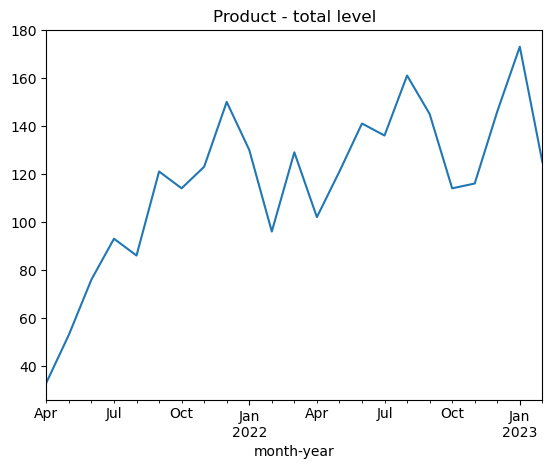

In [112]:
model_total["total"].plot(title="Product - total level");

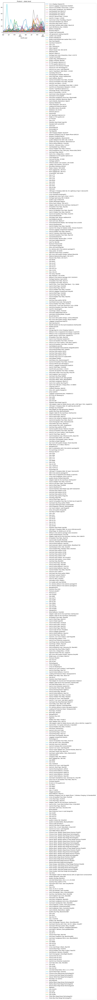

In [113]:
ax = model_total[Product_hierarchy['total']].plot(title="Product - state level")
ax.legend(bbox_to_anchor=(1.0, 1.0));

## Model

In [114]:
model_total_test = model_total[-4:]

In [115]:
model_total_test

,2-in-1 Display Cleaner278,55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,"Active Foam Cleaner, 300 ml272","Adapter Cable Set for the Audi Music Interface, Mini USB478",Adapter Cable Set for the Audi Music Interface477,Adapter Cable Set for the Audi Music Interface520,Adapter Cable Set for the Audi Music Interface589,Adapter Cable for the Audi Music Interface516,Adapter Cable for the Audi Music Interface523,Adapter Cable for the Audi Music Interface557,Adapter Cable for the Audi Music Interface615,"All-weather Floor Mats, Rear296","All-weather Floor Mats, Rear317","All-weather Floor Mats, Rear475","All-weather Floor Mats, Rear481","All-weather Floor Mats, Rear578","All-weather Floor Mats, Rear604",Anti-Marten Device393,"Anti-theft Wheel Bolts, M14 x 1.5 x 27556","Anti-theft Wheel Bolts, M14 x 1.5 x 35.5548","Anti-theft Wheel Bolts, M14 x 1.5 x 45455","Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Mud Flaps, Rear515",Audi A3 Pedal Caps358,"Audi A3 Rim, 5-arm Velum Matt Black. 7.5J x 18606","Audi A3 Rubber Floor Mats, Front738","Audi A3 Rubber Floor Mats, Rear500",Audi A3 Side Sill Set573,Audi A3 Sun Protection System531,Audi A3 Sun Protection System532,"Audi A4 All-weather Floor Mats, Front310","Audi A4 Car Cover (outdoor), Audi Rings542","Audi A4 Car Cover, Audi Rings395","Audi A4 LED Rear Lights, Dark-tinted469",Audi A4 Luggage Compartment Shell407,"Audi A4 Mud Flaps, Front330","Audi A4 Mud Flaps, Front499","Audi A4 Mud Flaps, Front526","Audi A4 Mud Flaps, Front553","Audi A4 Mud Flaps, Front600","Audi A4 Mud Flaps, Rear331","Audi A4 Mud Flaps, Rear547","Audi A4 Mud Flaps, Rear554","Audi A4 Mud Flaps, Rear558","Audi A4 Rim, 5-arm Rotor Brilliant Silver, 8.0Jx18605","Audi A4 Side Sill Set, Primed621",Audi A4 Tailgate Spoiler493,"Audi A4 Trim Strips for Radiator Grille, Chrome Finish637","Audi A4 Wind Deflector, Front364","Audi A4 Wind Deflector, Rear322","Audi A5 All-weather Floor Mats, Front734",Audi A5 Bootliner374,"Audi A5 Car Cover (indoor), Audi Sport Logo611","Audi A5 Convertible, Floret Silver, 1:43427","Audi A5 Rubber Floor Mats, Front567",Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi A6 Car Cover, Audi Rings399",Audi A6 Luggage Compartment Inlay495,"Audi A6 Mud Flaps, Front343","Audi A6 Mud Flaps, Front462","Audi A6 Mud Flaps, Front552","Audi A6 Mud Flaps, Rear482","Audi A6 Mud Flaps, Rear489","Audi A6 Rim, 5-tri-spoke Anthracite, 8.5Jx20607","Audi A6 Rubber Floor Mats in Black, Rear555","Audi A6 Rubber Floor Mats, Front631","Audi A6 Rubber Floor Mats, Rear561",Audi A6 Stainless Steel Pedal Caps with Footrest538,Audi A6 after facelift (RHD)486,Audi A6487,"Audi A7 Sportback, Myth Black, 1:43183","Audi A8 All-weather Floor Mats, Front354","Audi A8 All-weather Floor Mats, Rear323","Audi A8 L Car Cover (indoor), Audi Rings568","Audi A8 L Mud Flaps, Rear564",Audi A8 L Stainless Steel Pedal Caps539,"Audi A8 L, Monsoon Grey, 1:43122","Audi A8 Wind Deflector, Rear365","Audi Automatic Watch Limited Edition, Blue/black746","Audi Aviator Sunglasses, Gun Metal428",Audi Baby Mirror279,"Audi Baby Seat, Misano red/black419","Audi Backpack ADUI, Kids, Grey820","Audi Backpack Foldable, Black201",Audi Ballpoint pen205,Audi Ballpoint pen206,"Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Baseball Cap, White202","Audi Blouson, Womens, Rose899","Audi Cap ADUI, Kids, Grey/red690","Audi Cap Kaskade, Dark Grey898","Audi Card Case, Black127","Audi Child Seat, misano red/black402","Audi Chronograph Solar-powered, Beige/Brown653","Audi Chronograph Titanium, Mens, Silver/Black891","Audi Chronograph, Mens, Black/silver256","Audi Chronograph, Mens, Silver/White892","Audi Chronograph, Silver/Night Blue893","Audi Cufflinks, Black75","Audi Drinking Bottle ADUI, Kids693","Audi Entertainment Mobile, Twin Package Click & Go505","Audi Flexfit Cap e-tron, Black423","Audi Fountain Pen LAMY, Graphite424","Audi Insu

In [116]:
model_total_new = model_total[:-4]

In [117]:
model_total_new

,2-in-1 Display Cleaner278,55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,"Active Foam Cleaner, 300 ml272","Adapter Cable Set for the Audi Music Interface, Mini USB478",Adapter Cable Set for the Audi Music Interface477,Adapter Cable Set for the Audi Music Interface520,Adapter Cable Set for the Audi Music Interface589,Adapter Cable for the Audi Music Interface516,Adapter Cable for the Audi Music Interface523,Adapter Cable for the Audi Music Interface557,Adapter Cable for the Audi Music Interface615,"All-weather Floor Mats, Rear296","All-weather Floor Mats, Rear317","All-weather Floor Mats, Rear475","All-weather Floor Mats, Rear481","All-weather Floor Mats, Rear578","All-weather Floor Mats, Rear604",Anti-Marten Device393,"Anti-theft Wheel Bolts, M14 x 1.5 x 27556","Anti-theft Wheel Bolts, M14 x 1.5 x 35.5548","Anti-theft Wheel Bolts, M14 x 1.5 x 45455","Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Mud Flaps, Rear515",Audi A3 Pedal Caps358,"Audi A3 Rim, 5-arm Velum Matt Black. 7.5J x 18606","Audi A3 Rubber Floor Mats, Front738","Audi A3 Rubber Floor Mats, Rear500",Audi A3 Side Sill Set573,Audi A3 Sun Protection System531,Audi A3 Sun Protection System532,"Audi A4 All-weather Floor Mats, Front310","Audi A4 Car Cover (outdoor), Audi Rings542","Audi A4 Car Cover, Audi Rings395","Audi A4 LED Rear Lights, Dark-tinted469",Audi A4 Luggage Compartment Shell407,"Audi A4 Mud Flaps, Front330","Audi A4 Mud Flaps, Front499","Audi A4 Mud Flaps, Front526","Audi A4 Mud Flaps, Front553","Audi A4 Mud Flaps, Front600","Audi A4 Mud Flaps, Rear331","Audi A4 Mud Flaps, Rear547","Audi A4 Mud Flaps, Rear554","Audi A4 Mud Flaps, Rear558","Audi A4 Rim, 5-arm Rotor Brilliant Silver, 8.0Jx18605","Audi A4 Side Sill Set, Primed621",Audi A4 Tailgate Spoiler493,"Audi A4 Trim Strips for Radiator Grille, Chrome Finish637","Audi A4 Wind Deflector, Front364","Audi A4 Wind Deflector, Rear322","Audi A5 All-weather Floor Mats, Front734",Audi A5 Bootliner374,"Audi A5 Car Cover (indoor), Audi Sport Logo611","Audi A5 Convertible, Floret Silver, 1:43427","Audi A5 Rubber Floor Mats, Front567",Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi A6 Car Cover, Audi Rings399",Audi A6 Luggage Compartment Inlay495,"Audi A6 Mud Flaps, Front343","Audi A6 Mud Flaps, Front462","Audi A6 Mud Flaps, Front552","Audi A6 Mud Flaps, Rear482","Audi A6 Mud Flaps, Rear489","Audi A6 Rim, 5-tri-spoke Anthracite, 8.5Jx20607","Audi A6 Rubber Floor Mats in Black, Rear555","Audi A6 Rubber Floor Mats, Front631","Audi A6 Rubber Floor Mats, Rear561",Audi A6 Stainless Steel Pedal Caps with Footrest538,Audi A6 after facelift (RHD)486,Audi A6487,"Audi A7 Sportback, Myth Black, 1:43183","Audi A8 All-weather Floor Mats, Front354","Audi A8 All-weather Floor Mats, Rear323","Audi A8 L Car Cover (indoor), Audi Rings568","Audi A8 L Mud Flaps, Rear564",Audi A8 L Stainless Steel Pedal Caps539,"Audi A8 L, Monsoon Grey, 1:43122","Audi A8 Wind Deflector, Rear365","Audi Automatic Watch Limited Edition, Blue/black746","Audi Aviator Sunglasses, Gun Metal428",Audi Baby Mirror279,"Audi Baby Seat, Misano red/black419","Audi Backpack ADUI, Kids, Grey820","Audi Backpack Foldable, Black201",Audi Ballpoint pen205,Audi Ballpoint pen206,"Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Baseball Cap, White202","Audi Blouson, Womens, Rose899","Audi Cap ADUI, Kids, Grey/red690","Audi Cap Kaskade, Dark Grey898","Audi Card Case, Black127","Audi Child Seat, misano red/black402","Audi Chronograph Solar-powered, Beige/Brown653","Audi Chronograph Titanium, Mens, Silver/Black891","Audi Chronograph, Mens, Black/silver256","Audi Chronograph, Mens, Silver/White892","Audi Chronograph, Silver/Night Blue893","Audi Cufflinks, Black75","Audi Drinking Bottle ADUI, Kids693","Audi Entertainment Mobile, Twin Package Click & Go505","Audi Flexfit Cap e-tron, Black423","Audi Fountain Pen LAMY, Graphite424","Audi Insu

## OLS — the optimal combination using OLS

In [155]:
model_ols_arima = hts.HTSRegressor(model='auto_arima', revision_method='OLS', n_jobs=0)

In [156]:
model_ols_arima = model_ols_arima.fit(model_total_new, Product_hierarchy)

Fitting models: 100%|██████████| 566/566 [03:28<00:00,  2.71it/s]


In [157]:
pred_ols_arima = model_ols_arima.predict(steps_ahead=4)

Fitting models: 100%|██████████| 566/566 [00:04<00:00, 119.42it/s]


In [158]:
pred_ols_arima

,total,2-in-1 Display Cleaner278,Audi A4 Luggage Compartment Shell407,"Audi A5 Convertible, Floret Silver, 1:43427","Audi Aviator Sunglasses, Gun Metal428","Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Q5, Navarra Blue, 1:43426","Audi Rs 5 Coupe, 1:43181","Audi Smart Urban Travelbag, Grey157","Audi Sport Baseball cap, Kids79","Audi Sport Mug Carbon, Grey71","Audi Sport Number plate holder, Black119","Audi USB Memory Key, 8 GB281",Battery Charger381,Business Bag373,Cockpit Care Solution406,LED gooseneck reading lamp292,Leather Care Set285,Pocket Umbrella130,"Ready-mixed Windscreen washer fluid, 3 l273",Rear Seat Bag382,Seat Back Pocket375,Size L143,Size: 158/164152,Valve Caps287,"Wheel Cleaner Gel, 500 ml276",Wheelsens288,Women's Watch72,"heritage Auto Union Streamline, Silver 1:43170",myAudi Connect80,"quattro Mug, White/black123","quattro Umbrella, Black84",55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 Car Cover, Audi Rings399","Audi A7 Sportback, Myth Black, 1:43183",Audi Baby Mirror279,"Audi Backpack Foldable, Black201","Audi Child Seat, misano red/black402","Audi Cufflinks, Black75","Audi Q2 All-weather Floor Mats, Front301","Audi Q2 All-weather Floor Mats, Rear289","Audi Q8, Orca Black, 1:43126","Audi R8 Coupé, Camouflage Green Matt, 1:18420","Audi R8 Lms Presentation Warpaint, 1:43164",Audi RS 7 Sportback tiptronic112,"Audi Rings Decals, Floret Silver298","Audi S5 Convertible, 1:43176","Audi Smart Urban Backpack, Grey142",Audi Sport In Ear plugs60,"Audi Sport Sunglasses mirror lens, Black/red66","Audi Sport Umbrella, Black/red, Big133","Audi Umbrella, Black/silver, Big132",Espresso Mobile291,"Insect Eliminator, 500 ml274",Loading Sill Protective Mat307,Microfibre Interior Brush280,"Notebook, Din A5144",Premium plus111,Premium99,RS7 Sportback tiptronic112,RSQ8 4.0 TFSI quattro116,S5 TFSI109,Size L135,Stainless Steel Pedal Caps356,Standard with sunroof100,TEST1425,Technology104,Technology110,Tow Rope282,USB Charging Adapter (dual)297,Wireless Charging Cover for Apple iPhone 6/6S325,Wireless Charging Pad320,"heritage Sunglasses, Black/red156","quattro Ballpoint Pen With USB, 8 GB136","quattro Key Ring Carabiner, Black/silver124","Audi A4 Wind Deflector, Front364","Audi A8 L, Monsoon Grey, 1:43122","Audi Baseball Cap, White202","Audi Q7 Rubber Floor Mats, Front327","Audi Smartphone Case, Dark grey, iPhone 6/6s/7/8433","Audi Sport Mug, Red141","Audi e-tron, Antigua Blue, 1:18429",Celebration 55 TFSI quattro tiptronic115,Coat Hanger290,"Cool and Hot Box, 20 l408",Heritage wallet76,"Intensive plastic care solution, 250 ml268","Leather Care Solution, 250 ml270",Microfibre Polishing cloth267,"Plastic Cleaner, 500 ml269","Roof Luggage Box, 300 l414","Roof Luggage Box, 360 l415","Screenwash, 500 ml264",Size L175,Size L199,Size L216,Size M165,Size S184,Size S214,Size S442,Size XL160,TEST2447,"USB type-C Charging Cable Set, for Lightning & Type C devices355",e-tron Booking449,e-tron Sportback Booking451,"heritage Auto Union Typ B, Silver 1:43171","heritage Spark plug USB, 8 GB204",quattro Logo in Black339,quattro Messenger Bag203,"Active Foam Cleaner, 300 ml272",Adapter Cable Set for the Audi Music Interface477,"All-weather Floor Mats, Rear481",Anti-Marten Device393,"Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Rubber Floor Mats, Rear500","Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi Baby Seat, Misano red/black419",Audi Ballpoint pen205,"Audi Card Case, Black127","Audi Entertainment Mobile, Twin Package Click & Go505",Audi Q3 Bootliner494,"Audi Q3 Rubber Floor Mats, Rear466","Audi Q3 Trim Strips for Radiator Grille, Chrome Finish474",Audi Q5 Luggage Compartment Shell533,"Audi Q5 Rubber Floor Mats, Rear497",Audi Q7 Stainless Steel Pedal Caps454,"Audi Q8 All-weather Floor Mats, Rear318",Audi Q8 Bootliner383,"Audi S8 limited, Navarra Blue, 1:43150",Audi Sport Ballpointpen197,"Audi

In [159]:
model_total_test

,2-in-1 Display Cleaner278,55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,"Active Foam Cleaner, 300 ml272","Adapter Cable Set for the Audi Music Interface, Mini USB478",Adapter Cable Set for the Audi Music Interface477,Adapter Cable Set for the Audi Music Interface520,Adapter Cable Set for the Audi Music Interface589,Adapter Cable for the Audi Music Interface516,Adapter Cable for the Audi Music Interface523,Adapter Cable for the Audi Music Interface557,Adapter Cable for the Audi Music Interface615,"All-weather Floor Mats, Rear296","All-weather Floor Mats, Rear317","All-weather Floor Mats, Rear475","All-weather Floor Mats, Rear481","All-weather Floor Mats, Rear578","All-weather Floor Mats, Rear604",Anti-Marten Device393,"Anti-theft Wheel Bolts, M14 x 1.5 x 27556","Anti-theft Wheel Bolts, M14 x 1.5 x 35.5548","Anti-theft Wheel Bolts, M14 x 1.5 x 45455","Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Mud Flaps, Rear515",Audi A3 Pedal Caps358,"Audi A3 Rim, 5-arm Velum Matt Black. 7.5J x 18606","Audi A3 Rubber Floor Mats, Front738","Audi A3 Rubber Floor Mats, Rear500",Audi A3 Side Sill Set573,Audi A3 Sun Protection System531,Audi A3 Sun Protection System532,"Audi A4 All-weather Floor Mats, Front310","Audi A4 Car Cover (outdoor), Audi Rings542","Audi A4 Car Cover, Audi Rings395","Audi A4 LED Rear Lights, Dark-tinted469",Audi A4 Luggage Compartment Shell407,"Audi A4 Mud Flaps, Front330","Audi A4 Mud Flaps, Front499","Audi A4 Mud Flaps, Front526","Audi A4 Mud Flaps, Front553","Audi A4 Mud Flaps, Front600","Audi A4 Mud Flaps, Rear331","Audi A4 Mud Flaps, Rear547","Audi A4 Mud Flaps, Rear554","Audi A4 Mud Flaps, Rear558","Audi A4 Rim, 5-arm Rotor Brilliant Silver, 8.0Jx18605","Audi A4 Side Sill Set, Primed621",Audi A4 Tailgate Spoiler493,"Audi A4 Trim Strips for Radiator Grille, Chrome Finish637","Audi A4 Wind Deflector, Front364","Audi A4 Wind Deflector, Rear322","Audi A5 All-weather Floor Mats, Front734",Audi A5 Bootliner374,"Audi A5 Car Cover (indoor), Audi Sport Logo611","Audi A5 Convertible, Floret Silver, 1:43427","Audi A5 Rubber Floor Mats, Front567",Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi A6 Car Cover, Audi Rings399",Audi A6 Luggage Compartment Inlay495,"Audi A6 Mud Flaps, Front343","Audi A6 Mud Flaps, Front462","Audi A6 Mud Flaps, Front552","Audi A6 Mud Flaps, Rear482","Audi A6 Mud Flaps, Rear489","Audi A6 Rim, 5-tri-spoke Anthracite, 8.5Jx20607","Audi A6 Rubber Floor Mats in Black, Rear555","Audi A6 Rubber Floor Mats, Front631","Audi A6 Rubber Floor Mats, Rear561",Audi A6 Stainless Steel Pedal Caps with Footrest538,Audi A6 after facelift (RHD)486,Audi A6487,"Audi A7 Sportback, Myth Black, 1:43183","Audi A8 All-weather Floor Mats, Front354","Audi A8 All-weather Floor Mats, Rear323","Audi A8 L Car Cover (indoor), Audi Rings568","Audi A8 L Mud Flaps, Rear564",Audi A8 L Stainless Steel Pedal Caps539,"Audi A8 L, Monsoon Grey, 1:43122","Audi A8 Wind Deflector, Rear365","Audi Automatic Watch Limited Edition, Blue/black746","Audi Aviator Sunglasses, Gun Metal428",Audi Baby Mirror279,"Audi Baby Seat, Misano red/black419","Audi Backpack ADUI, Kids, Grey820","Audi Backpack Foldable, Black201",Audi Ballpoint pen205,Audi Ballpoint pen206,"Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Baseball Cap, White202","Audi Blouson, Womens, Rose899","Audi Cap ADUI, Kids, Grey/red690","Audi Cap Kaskade, Dark Grey898","Audi Card Case, Black127","Audi Child Seat, misano red/black402","Audi Chronograph Solar-powered, Beige/Brown653","Audi Chronograph Titanium, Mens, Silver/Black891","Audi Chronograph, Mens, Black/silver256","Audi Chronograph, Mens, Silver/White892","Audi Chronograph, Silver/Night Blue893","Audi Cufflinks, Black75","Audi Drinking Bottle ADUI, Kids693","Audi Entertainment Mobile, Twin Package Click & Go505","Audi Flexfit Cap e-tron, Black423","Audi Fountain Pen LAMY, Graphite424","Audi Insu

In [3]:
model_total_new['total'].plot(legend=True , figsize=(15,5))
pred_ols_arima['total'][-4:].plot(legend=True)
model_total_test['total'].plot(legend=True)

NameError: name 'model_total_new' is not defined

In [161]:
pred_ols_arima_csv_data = pred_ols_arima.to_csv('pred_ols_arima_data.csv', index = True)

## Stationality

In [124]:
from statsmodels.tsa.stattools import adfuller

In [125]:
def ad_test(dataset):
    dftest = adfuller(dataset, autolag = 'AIC')
    print("1. ADF : ",dftest[0])
    print("2. P-Value : ", dftest[1])
    print("3. Num Of Lags : ", dftest[2])
    print("4. Num Of Observations Used For ADF Regression:",dftest[3])
    print("5. Critical Values :")
    for key, val in dftest[4].items():
        print("\t",key, ": ", val)
ad_test(model_total["total"])

1. ADF :  -3.1096678541326765
2. P-Value :  0.025845947781423205
3. Num Of Lags :  0
4. Num Of Observations Used For ADF Regression: 22
5. Critical Values :
	 1% :  -3.769732625845229
	 5% :  -3.005425537190083
	 10% :  -2.6425009917355373


## SMAPE

In [126]:
# On test train split data (out sample)

In [127]:
def smape(actual,forecast):
    return 100/len(actual) * np.sum(2 * np.abs(forecast - actual) / (np.abs(actual) + np.abs(forecast)))
Actual = np.array([125, 173, 146, 116])
Forecast = np.array([114.696115, 114.715829, 114.770613, 114.770613])
result = smape(Actual, Forecast)
print("SMAPE :", result)

SMAPE : 18.53240741320917


## Grid Search

In [348]:
Models=['holt_winters','auto_arima','sarimax']
Revision_methods=['AHP','PHA','FP','OLS','WLSS','WLSV']

In [391]:
def mape(actual,forecast):
    return 1/len(actual) * np.sum(np.abs((actual - forecast)/actual))
output = 100
for i in Models:
    for j in Revision_methods:
        best_model = hts.HTSRegressor(model=i, revision_method=j, n_jobs=0)
        best_model = best_model.fit(model_total_new, Product_hierarchy)
        pred_best_model = best_model.predict(steps_ahead=4)
        lst_act = []
        lst_forcst = []
        for l in range(4):
            lst_act.append(np.array(model_total_test['total'][l]))
            lst_forcst.append(np.array(pred_best_model['total'][18+l]))
        lst_act = np.array(lst_act)
        lst_forcst = np.array(lst_forcst)
        mape = 100/len(lst_act) * np.sum(np.abs(lst_act - lst_forcst)/np.abs(lst_act))
        print(mape,i,j)
        print(lst_act,lst_forcst)
        if mape<output:
            output=mape
            model=i
            revesion_model=j
print(output,model,revesion_model)

Fitting models:  88%|████████▊ | 500/566 [00:02<00:00, 244.30it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/

218.2551390831799 holt_winters AHP
[116 146 173 125] [498.10809816 408.93400384 408.93400384 408.93400384]


Fitting models:  88%|████████▊ | 500/566 [00:02<00:00, 233.22it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
Fitting models:  93%|█████████▎| 524/566 [

231.84108727747562 holt_winters PHA
[116 146 173 125] [519.37176365 426.39092915 426.39092915 426.39092915]


Fitting models:  90%|████████▉ | 507/566 [00:02<00:00, 237.06it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/

99.9999403085789 holt_winters FP
[116 146 173 125] [1.13508756e-04 6.83061650e-05 6.83061650e-05 6.83061650e-05]


Fitting models:  90%|█████████ | 511/566 [00:03<00:00, 128.00it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/

19.000060354846703 holt_winters OLS
[116 146 173 125] [148.26872027 122.06580129 122.06580129 122.06580129]


Fitting models:  89%|████████▉ | 505/566 [00:02<00:00, 212.74it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/

229.2862012582561 holt_winters WLSS
[116 146 173 125] [437.48156276 455.65726275 455.65726275 455.65726275]


Fitting models:  89%|████████▉ | 506/566 [00:02<00:00, 231.28it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/

19.38959577634853 holt_winters WLSV
[116 146 173 125] [147.24088499 120.88099923 120.88099923 120.88099923]


Fitting models: 100%|██████████| 566/566 [00:02<00:00, 196.93it/s]
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/hts/functions.py:175: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  fcst = fcst[:, np.newaxis]
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/hts/hierarchy/__init__.py:360: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  df = pandas.concat(


204.61121591204386 auto_arima AHP
[116 146 173 125] [490.51978144 385.65003506 385.65003506 385.65003506]


Fitting models: 100%|██████████| 566/566 [00:03<00:00, 173.03it/s]
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/hts/functions.py:175: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  fcst = fcst[:, np.newaxis]
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/hts/hierarchy/__init__.py:360: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  df = pandas.concat(
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/hts/functions.py:191: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  props = props[:, np.newaxis]


217.61472061806154 auto_arima PHA
[116 146 173 125] [511.45951036 402.11299435 402.11299435 402.11299435]


Fitting models: 100%|██████████| 566/566 [00:03<00:00, 171.87it/s]


99.5945296926471 auto_arima FP
[116 146 173 125] [0.50436092 0.40348586 0.66088841 0.66088841]


Fitting models: 100%|██████████| 566/566 [00:03<00:00, 153.26it/s]


22.238001882774057 auto_arima OLS
[116 146 173 125] [145.81245085 114.80611119 114.77061305 114.71582947]


Fitting models: 100%|██████████| 566/566 [00:02<00:00, 191.59it/s]


150.69120274322887 auto_arima WLSS
[116 146 173 125] [374.92359071 342.12946777 332.08349185 316.57973931]


Fitting models: 100%|██████████| 566/566 [00:03<00:00, 169.27it/s]


22.45571941419676 auto_arima WLSV
[116 146 173 125] [144.99865342 113.99894131 113.99894131 113.99894131]


Fitting models:   0%|          | 0/566 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:   1%|          | 5/566 [00:00<00:13, 41.49it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:  14%|█▎        | 77/566 [00:01<00:07, 67.37it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregress

190.61138021452234 sarimax AHP
[116 146 173 125] [476.96772749 374.99531679 364.63496649 354.56085139]


Fitting models:   0%|          | 0/566 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:   1%|          | 5/566 [00:00<00:13, 40.93it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:  14%|█▍        | 78/566 [00:01<00:07, 66.85it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregress

203.0172479332377 sarimax PHA
[116 146 173 125] [497.32893471 391.00343833 380.20081652 369.69664895]


Fitting models:   0%|          | 0/566 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:   1%|          | 4/566 [00:00<00:15, 36.80it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:  14%|█▍        | 82/566 [00:01<00:07, 65.25it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregress

100.0 sarimax FP
[116 146 173 125] [3.19460397e-282 1.16022908e-304 4.69428372e-311 1.89930593e-317]


Fitting models:   0%|          | 0/566 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:   1%|          | 5/566 [00:00<00:13, 42.22it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:  14%|█▎        | 77/566 [00:01<00:07, 62.84it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregress

24.773035650165088 sarimax OLS
[116 146 173 125] [141.56031135 111.43555913 108.19073605 105.09860677]


Fitting models:   0%|          | 0/566 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:   1%|          | 5/566 [00:00<00:13, 42.37it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:  14%|█▍        | 78/566 [00:01<00:07, 62.32it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregress

81.62297901459806 sarimax WLSS
[116 146 173 125] [301.2748166  276.4464351  221.80603026 186.51724379]


Fitting models:   0%|          | 0/566 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:   1%|          | 5/566 [00:00<00:13, 41.25it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
Fitting models:  14%|█▍        | 82/566 [00:01<00:06, 69.31it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregress

24.86749455868131 sarimax WLSV
[116 146 173 125] [140.991934   110.84883087 107.78630537 104.80839117]
19.000060354846703 holt_winters OLS


In [368]:
lst_act1 = []
lst_forcst1 = []
for l in range(4):
            lst_act1.append(np.array(model_total_test['total'][l]))
            lst_forcst1.append(np.array(pred_best_model['total'][18+l]))

In [369]:
lst_act1

[array(116), array(146), array(173), array(125)]

## OLS — the optimal combination using OLS

In [350]:
model_ols_arima = hts.HTSRegressor(model='holt_winters', revision_method='OLS', n_jobs=0)

In [351]:
model_ols_arima = model_ols_arima.fit(model_total_new, Product_hierarchy)

Fitting models:  90%|█████████ | 511/566 [00:03<00:00, 115.99it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/

In [352]:
pred_ols_arima = model_ols_arima.predict(steps_ahead=4)

Fitting models:  90%|█████████ | 512/566 [00:02<00:00, 377.09it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1409: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:1415: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/home/ec2-user/anaconda3/envs/pytorch_p39/

In [353]:
pred_ols_arima

,total,2-in-1 Display Cleaner278,Audi A4 Luggage Compartment Shell407,"Audi A5 Convertible, Floret Silver, 1:43427","Audi Aviator Sunglasses, Gun Metal428","Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Q5, Navarra Blue, 1:43426","Audi Rs 5 Coupe, 1:43181","Audi Smart Urban Travelbag, Grey157","Audi Sport Baseball cap, Kids79","Audi Sport Mug Carbon, Grey71","Audi Sport Number plate holder, Black119","Audi USB Memory Key, 8 GB281",Battery Charger381,Business Bag373,Cockpit Care Solution406,LED gooseneck reading lamp292,Leather Care Set285,Pocket Umbrella130,"Ready-mixed Windscreen washer fluid, 3 l273",Rear Seat Bag382,Seat Back Pocket375,Size L143,Size: 158/164152,Valve Caps287,"Wheel Cleaner Gel, 500 ml276",Wheelsens288,Women's Watch72,"heritage Auto Union Streamline, Silver 1:43170",myAudi Connect80,"quattro Mug, White/black123","quattro Umbrella, Black84",55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 Car Cover, Audi Rings399","Audi A7 Sportback, Myth Black, 1:43183",Audi Baby Mirror279,"Audi Backpack Foldable, Black201","Audi Child Seat, misano red/black402","Audi Cufflinks, Black75","Audi Q2 All-weather Floor Mats, Front301","Audi Q2 All-weather Floor Mats, Rear289","Audi Q8, Orca Black, 1:43126","Audi R8 Coupé, Camouflage Green Matt, 1:18420","Audi R8 Lms Presentation Warpaint, 1:43164",Audi RS 7 Sportback tiptronic112,"Audi Rings Decals, Floret Silver298","Audi S5 Convertible, 1:43176","Audi Smart Urban Backpack, Grey142",Audi Sport In Ear plugs60,"Audi Sport Sunglasses mirror lens, Black/red66","Audi Sport Umbrella, Black/red, Big133","Audi Umbrella, Black/silver, Big132",Espresso Mobile291,"Insect Eliminator, 500 ml274",Loading Sill Protective Mat307,Microfibre Interior Brush280,"Notebook, Din A5144",Premium plus111,Premium99,RS7 Sportback tiptronic112,RSQ8 4.0 TFSI quattro116,S5 TFSI109,Size L135,Stainless Steel Pedal Caps356,Standard with sunroof100,TEST1425,Technology104,Technology110,Tow Rope282,USB Charging Adapter (dual)297,Wireless Charging Cover for Apple iPhone 6/6S325,Wireless Charging Pad320,"heritage Sunglasses, Black/red156","quattro Ballpoint Pen With USB, 8 GB136","quattro Key Ring Carabiner, Black/silver124","Audi A4 Wind Deflector, Front364","Audi A8 L, Monsoon Grey, 1:43122","Audi Baseball Cap, White202","Audi Q7 Rubber Floor Mats, Front327","Audi Smartphone Case, Dark grey, iPhone 6/6s/7/8433","Audi Sport Mug, Red141","Audi e-tron, Antigua Blue, 1:18429",Celebration 55 TFSI quattro tiptronic115,Coat Hanger290,"Cool and Hot Box, 20 l408",Heritage wallet76,"Intensive plastic care solution, 250 ml268","Leather Care Solution, 250 ml270",Microfibre Polishing cloth267,"Plastic Cleaner, 500 ml269","Roof Luggage Box, 300 l414","Roof Luggage Box, 360 l415","Screenwash, 500 ml264",Size L175,Size L199,Size L216,Size M165,Size S184,Size S214,Size S442,Size XL160,TEST2447,"USB type-C Charging Cable Set, for Lightning & Type C devices355",e-tron Booking449,e-tron Sportback Booking451,"heritage Auto Union Typ B, Silver 1:43171","heritage Spark plug USB, 8 GB204",quattro Logo in Black339,quattro Messenger Bag203,"Active Foam Cleaner, 300 ml272",Adapter Cable Set for the Audi Music Interface477,"All-weather Floor Mats, Rear481",Anti-Marten Device393,"Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Rubber Floor Mats, Rear500","Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi Baby Seat, Misano red/black419",Audi Ballpoint pen205,"Audi Card Case, Black127","Audi Entertainment Mobile, Twin Package Click & Go505",Audi Q3 Bootliner494,"Audi Q3 Rubber Floor Mats, Rear466","Audi Q3 Trim Strips for Radiator Grille, Chrome Finish474",Audi Q5 Luggage Compartment Shell533,"Audi Q5 Rubber Floor Mats, Rear497",Audi Q7 Stainless Steel Pedal Caps454,"Audi Q8 All-weather Floor Mats, Rear318",Audi Q8 Bootliner383,"Audi S8 limited, Navarra Blue, 1:43150",Audi Sport Ballpointpen197,"Audi

In [150]:
def smape(actual,forecast):
    return 100/len(actual) * np.sum(2 * np.abs(forecast - actual) / (np.abs(actual) + np.abs(forecast)))
Actual = np.array([125, 173, 146, 116])
Forecast = np.array([122.065801, 122.065801, 122.065801, 122.065801])
result = smape(Actual, Forecast)
print("SMAPE :", result)

SMAPE : 14.96301438944927


In [366]:
model_total_test

,2-in-1 Display Cleaner278,55 TFSI quattro tiptronic113,55 TFSI quattro tiptronic114,"Active Foam Cleaner, 300 ml272","Adapter Cable Set for the Audi Music Interface, Mini USB478",Adapter Cable Set for the Audi Music Interface477,Adapter Cable Set for the Audi Music Interface520,Adapter Cable Set for the Audi Music Interface589,Adapter Cable for the Audi Music Interface516,Adapter Cable for the Audi Music Interface523,Adapter Cable for the Audi Music Interface557,Adapter Cable for the Audi Music Interface615,"All-weather Floor Mats, Rear296","All-weather Floor Mats, Rear317","All-weather Floor Mats, Rear475","All-weather Floor Mats, Rear481","All-weather Floor Mats, Rear578","All-weather Floor Mats, Rear604",Anti-Marten Device393,"Anti-theft Wheel Bolts, M14 x 1.5 x 27556","Anti-theft Wheel Bolts, M14 x 1.5 x 35.5548","Anti-theft Wheel Bolts, M14 x 1.5 x 45455","Audi A3 All-Weather Floor Mats, Rear491","Audi A3 Mud Flaps, Rear515",Audi A3 Pedal Caps358,"Audi A3 Rim, 5-arm Velum Matt Black. 7.5J x 18606","Audi A3 Rubber Floor Mats, Front738","Audi A3 Rubber Floor Mats, Rear500",Audi A3 Side Sill Set573,Audi A3 Sun Protection System531,Audi A3 Sun Protection System532,"Audi A4 All-weather Floor Mats, Front310","Audi A4 Car Cover (outdoor), Audi Rings542","Audi A4 Car Cover, Audi Rings395","Audi A4 LED Rear Lights, Dark-tinted469",Audi A4 Luggage Compartment Shell407,"Audi A4 Mud Flaps, Front330","Audi A4 Mud Flaps, Front499","Audi A4 Mud Flaps, Front526","Audi A4 Mud Flaps, Front553","Audi A4 Mud Flaps, Front600","Audi A4 Mud Flaps, Rear331","Audi A4 Mud Flaps, Rear547","Audi A4 Mud Flaps, Rear554","Audi A4 Mud Flaps, Rear558","Audi A4 Rim, 5-arm Rotor Brilliant Silver, 8.0Jx18605","Audi A4 Side Sill Set, Primed621",Audi A4 Tailgate Spoiler493,"Audi A4 Trim Strips for Radiator Grille, Chrome Finish637","Audi A4 Wind Deflector, Front364","Audi A4 Wind Deflector, Rear322","Audi A5 All-weather Floor Mats, Front734",Audi A5 Bootliner374,"Audi A5 Car Cover (indoor), Audi Sport Logo611","Audi A5 Convertible, Floret Silver, 1:43427","Audi A5 Rubber Floor Mats, Front567",Audi A6 45 TFSI Premium Plus108,Audi A6 45 TFSI Technology107,"Audi A6 All-weather Floor Mats, Front479",Audi A6 Bootliner380,"Audi A6 Car Cover, Audi Rings399",Audi A6 Luggage Compartment Inlay495,"Audi A6 Mud Flaps, Front343","Audi A6 Mud Flaps, Front462","Audi A6 Mud Flaps, Front552","Audi A6 Mud Flaps, Rear482","Audi A6 Mud Flaps, Rear489","Audi A6 Rim, 5-tri-spoke Anthracite, 8.5Jx20607","Audi A6 Rubber Floor Mats in Black, Rear555","Audi A6 Rubber Floor Mats, Front631","Audi A6 Rubber Floor Mats, Rear561",Audi A6 Stainless Steel Pedal Caps with Footrest538,Audi A6 after facelift (RHD)486,Audi A6487,"Audi A7 Sportback, Myth Black, 1:43183","Audi A8 All-weather Floor Mats, Front354","Audi A8 All-weather Floor Mats, Rear323","Audi A8 L Car Cover (indoor), Audi Rings568","Audi A8 L Mud Flaps, Rear564",Audi A8 L Stainless Steel Pedal Caps539,"Audi A8 L, Monsoon Grey, 1:43122","Audi A8 Wind Deflector, Rear365","Audi Automatic Watch Limited Edition, Blue/black746","Audi Aviator Sunglasses, Gun Metal428",Audi Baby Mirror279,"Audi Baby Seat, Misano red/black419","Audi Backpack ADUI, Kids, Grey820","Audi Backpack Foldable, Black201",Audi Ballpoint pen205,Audi Ballpoint pen206,"Audi Baseball Cap, Black117","Audi Baseball Cap, Blue207","Audi Baseball Cap, Red121","Audi Baseball Cap, White202","Audi Blouson, Womens, Rose899","Audi Cap ADUI, Kids, Grey/red690","Audi Cap Kaskade, Dark Grey898","Audi Card Case, Black127","Audi Child Seat, misano red/black402","Audi Chronograph Solar-powered, Beige/Brown653","Audi Chronograph Titanium, Mens, Silver/Black891","Audi Chronograph, Mens, Black/silver256","Audi Chronograph, Mens, Silver/White892","Audi Chronograph, Silver/Night Blue893","Audi Cufflinks, Black75","Audi Drinking Bottle ADUI, Kids693","Audi Entertainment Mobile, Twin Package Click & Go505","Audi Flexfit Cap e-tron, Black423","Audi Fountain Pen LAMY, Graphite424","Audi Insu

<AxesSubplot:xlabel='month-year'>

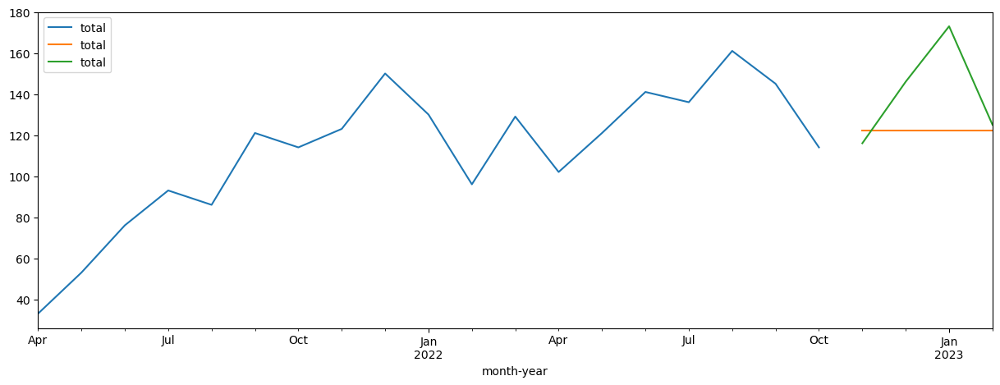

In [145]:
model_total_new['total'].plot(legend=True , figsize=(15,5))
pred_ols_arima['total'][-4:].plot(legend=True)
model_total_test['total'].plot(legend=True)

# EDA

In [165]:
myAudi_Varients[['title','size','price','quantity']][myAudi_Varients['size'].isnull()==False]

,title,size,price,quantity
45,"Audi Sport sweatjacket, Mens, Black",xs,7543.0,8
51,"Audi Sport Mid layer jacket, Mens, Grey",s,12658.0,4
63,"Audi Blouson, Womens, Rose",xs,10466.0,38
64,"Audi Sport Quilted Vest, Mens, Dark grey",s,10466.0,19
70,"Audi Sport Soft Shell Jacket, Mens, Black",s,13996.0,19
71,"Audi Sport Quilted Jacket, Mens, Black",s,17524.0,19
72,"Audi Sport Hybrid Jacket, Womens, Grey",xl,17751.0,10
73,"Audi Sport Hybrid Jacket, Mens, Grey",s,17977.0,10
97,Size L,m,8493.0,0
132,Size L,l,19699.0,0


In [194]:
myAudi_Varients.groupby(['title'])['price'].nunique()

title
12-18 months                    3
18-24 months                    2
2-in-1 Display Cleaner          1
5-6 years                       4
55 TFSI quattro tiptronic       1
                               ..
quattro Knitted Beanie, Grey    1
quattro Logo in Black           1
quattro Messenger Bag           1
quattro Mug, White/black        1
quattro Umbrella, Black         1
Name: price, Length: 581, dtype: int64

In [197]:
myAudi_Varients[myAudi_Varients['title']=='5-6 years'][['title','id','price','quantity']]

,title,id,price,quantity
204,5-6 years,242,4348.0,0
332,5-6 years,247,2268.0,0
391,5-6 years,235,3538.0,0
731,5-6 years,252,4082.0,0


In [175]:
myAudi_Varients[myAudi_Varients['title']=='Size L'][['title','size','price','quantity']]

,title,size,price,quantity
43,Size L,None,10634.0,0
97,Size L,m,8493.0,0
132,Size L,l,19699.0,0
143,Size L,None,12242.0,20
156,Size L,None,24608.0,31
160,Size L,None,6059.0,0
175,Size L,None,7296.0,0
182,Size L,None,3985.0,20
195,Size L,None,8577.0,0
214,Size L,None,9173.0,0


In [183]:
myAudi_Varients[myAudi_Varients['title']=='Size S'][['title','id','size','price','quantity']]

,title,id,size,price,quantity
40,Size S,878,None,8731.0,13
98,Size S,438,None,8493.0,6
138,Size S,657,s,13831.0,0
141,Size S,758,None,12242.0,12
153,Size S,442,s,24608.0,23
158,Size S,749,None,6059.0,49
173,Size S,660,s,7296.0,21
180,Size S,826,None,14661.0,1
184,Size S,139,None,3985.0,4
186,Size S,755,None,10955.0,0


In [200]:
myAudi_Varients['price'].isnull().sum()

0

In [322]:
myAudi_oli['name_varientId'] = myAudi_oli['name'] + myAudi_oli['itemVariantId']

In [323]:
myAudi_Varients['title_id'] = myAudi_Varients['title'] + myAudi_Varients['id']

In [324]:
lst_oli = myAudi_oli['name_varientId'].unique()

In [325]:
lst_varient = myAudi_Varients['title_id'].unique() 

In [326]:
len(lst_varient)

805

In [327]:
len(lst_oli)

572

In [328]:
lst1234 = []
count=0
for i in range(len(lst_oli)):
    for j in range(len(lst_varient)):
        if(lst_oli[i]==lst_varient[j]):
            break
        if(j==len(lst_varient)-1):
            lst1234.append(lst_oli[i])

In [329]:
len(set(lst1234))

15

In [330]:
lst1234

['Chronograph Men, Red/Black73',
 'Size: 158/164152',
 'TEST ONLY300',
 'RSQ8 4.0 TFSI quattro116',
 'RS7 Sportback tiptronic112',
 '55 TFSI quattro tiptronic113',
 'Test405',
 'Cool Box81',
 'Premium plus111',
 'M: 40-43 (21 cm)770',
 'L/XL: 44-47 (24 cm)771',
 'Pre-Book Now839',
 'Glacier White, Metallic-Mother of Pearl Beige-Premium Plus844',
 'Pulse Orange, Solid-Mother of Pearl Beige-Premium Plus846',
 'Mythos Black, Metallic-Mother of Pearl Beige-Premium Plus854']

In [ ]:
# Id Present in oli but not in varient table
73
81
300(test)
405(test)
770
771


In [299]:
myAudi_oli[myAudi_oli['name_varientId']=='55 TFSI quattro tiptronic113']

,id,accountId,locationId,orderId,itemId,itemVariantId,formResultId,quantity,price,tax,taxInfo,total,name,status,isRefunded,isCancelled,isItemAdded,couponId,couponCode,discount,fulfillmentType,fulfillmentPrice,addressBookId,fulfillmentAddress,fulfillmentLocationId,fulfillmentLocationPrice,fulfillmentLocationInfo,postOrderModuleId,postOrderModuleItemId,postOrderAction,postOrderResultId,staffCreatedBy,staffCreatedOn,createdOn,createdBy,variantWithItemName,fulfillmentLocationName,name_varientId
44,52,19,16,47,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-05-18 16:28:36,278,55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
278,286,19,24,260,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-06-11 10:30:58,23134,55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
301,309,19,22,275,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-06-13 19:11:38,23208,55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
421,429,19,31,379,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-06-25 09:25:59,23756,55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
581,590,19,27,500,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-07-13 11:07:27,24604,55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
681,690,19,26,584,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-07-20 20:04:59,26178,Audi A8 L Booking / 55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
690,699,19,19,593,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-07-21 15:49:39,26238,Audi A8 L Booking / 55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
789,798,19,16,670,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-08-01 06:45:58,27227,Audi A8 L Booking / 55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
902,913,19,34,759,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-08-16 06:39:09,30633,Audi A8 L Booking / 55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113
1356,1387,19,18,1072,69,113,None,1,1000000.0,None,None,1000000.0,55 TFSI quattro tiptronic,pending,None,None,None,None,None,0.0,None,0.0,None,None,None,0.0,None,None,None,None,None,None,None,2021-09-21 18:48:32,35617,Audi A8 L Booking / 55 TFSI quattro tiptronic,None,55 TFSI quattro tiptronic113


In [347]:
myAudi_Varients[myAudi_Varients['title_id']=='55 TFSI quattro tiptronic113']

,id,accountId,itemId,variantLocations,productCode,size,color,material,style,title,price,images,compareAtPrice,costPerItem,taxes,taxInfo,priceAfterTax,quantity,blocked,finalQuantity,isMinQuantity,minQuantity,isMaxQuantity,maxQuantity,isIncrementStep,incrementStep,weight,shippingType,isDisabledShipping,shippingPrice,isDisabledSelfPickup,selfPickupPrice,isDisabledFitment,fitmentPrice,isPublished,isPurchasable,order,pageId,postOrderModuleId,postOrderModuleItemId,postOrderAction,createdOn,createdBy,updatedOn,updatedBy,archivedBy,isArchived,taxInfoWithDecoded,photoArray,publishedText,invertedPublishedText,description,configStatus,photo,title_id


In [345]:
myAudi_Varients[myAudi_Varients['id']=='111'][['title','id']]

,title,id
640,Premium,111


In [346]:
myAudi_oli[myAudi_oli['itemVariantId']=='111'][['name','itemVariantId']]

,name,itemVariantId
135,Premium plus,111
474,Premium plus,111
528,Premium plus,111
654,Premium plus,111
655,Premium plus,111
689,Premium plus,111
830,Premium plus,111
906,Premium plus,111
1254,Premium plus,111
1265,Premium plus,111
